# Home Credit Default Risk (HCDR)

In [1]:
# #Mount Google Drive
from google.colab import drive 
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


The course project is based on the [Home Credit Default Risk (HCDR)  Kaggle Competition](https://www.kaggle.com/c/home-credit-default-risk/). The goal of this project is to predict whether or not a client will repay a loan. In order to make sure that people who struggle to get loans due to insufficient or non-existent credit histories have a positive loan experience, Home Credit makes use of a variety of alternative data--including telco and transactional information--to predict their clients' repayment abilities.


## Some of the challenges

1. Dataset size 
   * (688 meg uncompressed) with millions of rows of data
   * 2.71 Gig of data uncompressed
* Dealing with missing data
* Imbalanced datasets
* Summarizing transaction data


# Kaggle API setup
Kaggle is a Data Science Competition Platform which shares a lot of datasets. In the past, it was troublesome to submit your result as your have to go through the console in your browser and drag your files there. Now you can interact with Kaggle via the command line. E.g., 

```bash
! kaggle competitions files home-credit-default-risk
```

It is quite easy to setup, it takes me less than 15 minutes to finish a submission.

1. Install library
* Create a API Token (edit your profile on [Kaggle.com](https://www.kaggle.com/)); this produces `kaggle.json` file
* Put your JSON `kaggle.json` in the right place
* Access competition files; make submissions via the command (see examples below)
* Submit result

For more detailed information on setting the Kaggle API see [here](https://medium.com/@nokkk/make-your-kaggle-submissions-with-kaggle-official-api-f49093c04f8a) and [here](https://github.com/Kaggle/kaggle-api).



In [2]:
!pip install kaggle

In [3]:
pwd


'/content'

In [4]:
!mkdir ~/.kaggle
!cp /root/shared/Downloads/kaggle.json ~/.kaggle
!chmod 600 ~/.kaggle/kaggle.json

mkdir: cannot create directory ‘/root/.kaggle’: File exists
cp: cannot stat '/root/shared/Downloads/kaggle.json': No such file or directory
chmod: cannot access '/root/.kaggle/kaggle.json': No such file or directory


In [5]:
! kaggle competitions files home-credit-default-risk

Traceback (most recent call last):
  File "/usr/local/bin/kaggle", line 5, in <module>
    from kaggle.cli import main
  File "/usr/local/lib/python3.7/dist-packages/kaggle/__init__.py", line 23, in <module>
    api.authenticate()
  File "/usr/local/lib/python3.7/dist-packages/kaggle/api/kaggle_api_extended.py", line 166, in authenticate
    self.config_file, self.config_dir))
OSError: Could not find kaggle.json. Make sure it's located in /root/.kaggle. Or use the environment method.


# Team and project meta information.

**Project Title** - Home Credit Default Risk

**Group Number** - 16

**Team Members**: 
- Naga Jahnavi Dhulipalla – ndhulipa@iu.edu 
- Shivani Chennoju – schennoj@iu.edu 
- Shalini Kothuru – Skothuru@iu.edu 
- Bharath Chowdary Anumolu – banumolu@iu.edu
    
    
**Credit Assessment Plan**    
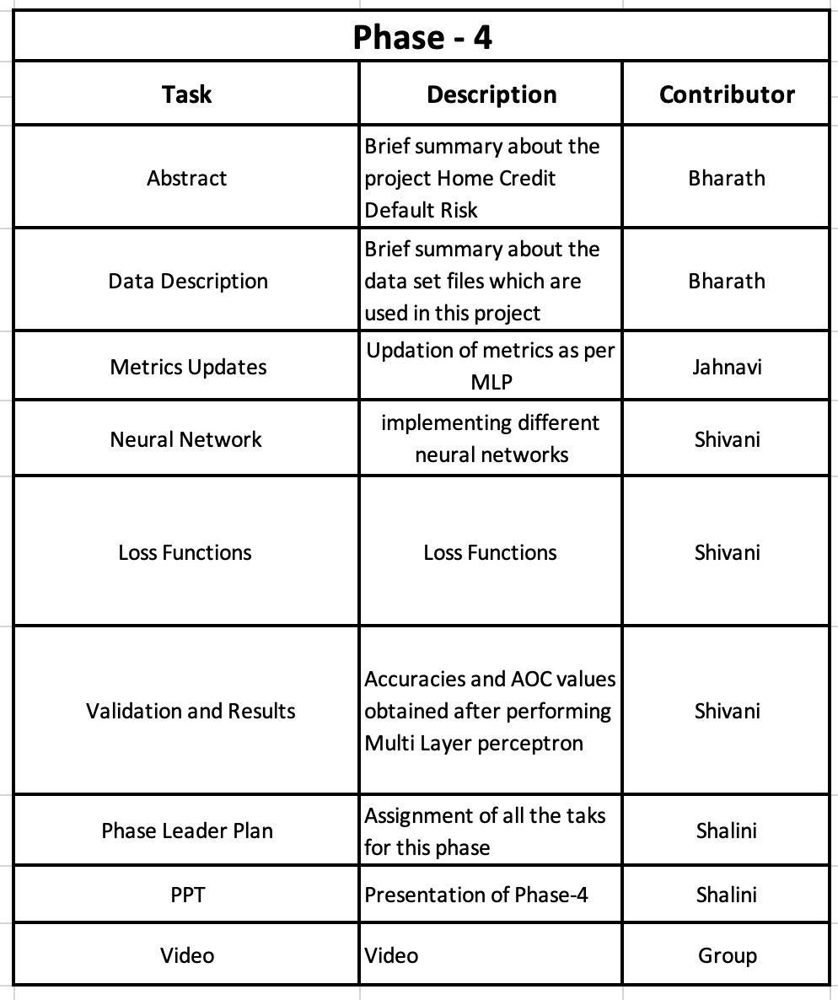

# Dataset and how to download


## Back ground Home Credit Group

Many people struggle to get loans due to insufficient or non-existent credit histories. And, unfortunately, this population is often taken advantage of by untrustworthy lenders.

### Home Credit Group

Home Credit strives to broaden financial inclusion for the unbanked population by providing a positive and safe borrowing experience. In order to make sure this underserved population has a positive loan experience, Home Credit makes use of a variety of alternative data--including telco and transactional information--to predict their clients' repayment abilities.

While Home Credit is currently using various statistical and machine learning methods to make these predictions, they're challenging Kagglers to help them unlock the full potential of their data. Doing so will ensure that clients capable of repayment are not rejected and that loans are given with a principal, maturity, and repayment calendar that will empower their clients to be successful.


## Background on the dataset
Home Credit is a non-banking financial institution, founded in 1997 in the Czech Republic.

The company operates in 14 countries (including United States, Russia, Kazahstan, Belarus, China, India) and focuses on lending primarily to people with little or no credit history which will either not obtain loans or became victims of untrustworthly lenders.

Home Credit group has over 29 million customers, total assests of 21 billions Euro, over 160 millions loans, with the majority in Asia and and almost half of them in China (as of 19-05-2018).

While Home Credit is currently using various statistical and machine learning methods to make these predictions, they're challenging Kagglers to help them unlock the full potential of their data. Doing so will ensure that clients capable of repayment are not rejected and that loans are given with a principal, maturity, and repayment calendar that will empower their clients to be successful.

## Data files overview
There are 7 different sources of data:

* __application_train/application_test:__ the main training and testing data with information about each loan application at Home Credit. Every loan has its own row and is identified by the feature SK_ID_CURR. The training application data comes with the TARGET indicating __0: the loan was repaid__ or __1: the loan was not repaid__. The target variable defines if the client had payment difficulties meaning he/she had late payment more than X days on at least one of the first Y installments of the loan. Such case is marked as 1 while other all other cases as 0.
* __bureau:__ data concerning client's previous credits from other financial institutions. Each previous credit has its own row in bureau, but one loan in the application data can have multiple previous credits.
* __bureau_balance:__ monthly data about the previous credits in bureau. Each row is one month of a previous credit, and a single previous credit can have multiple rows, one for each month of the credit length.
* __previous_application:__ previous applications for loans at Home Credit of clients who have loans in the application data. Each current loan in the application data can have multiple previous loans. Each previous application has one row and is identified by the feature SK_ID_PREV.
* __POS_CASH_BALANCE:__ monthly data about previous point of sale or cash loans clients have had with Home Credit. Each row is one month of a previous point of sale or cash loan, and a single previous loan can have many rows.
* credit_card_balance: monthly data about previous credit cards clients have had with Home Credit. Each row is one month of a credit card balance, and a single credit card can have many rows.
* __installments_payment:__ payment history for previous loans at Home Credit. There is one row for every made payment and one row for every missed payment.

In [6]:
DATA_DIR = "/content/gdrive/MyDrive/AML/home-credit-default-risk"   #same level as course repo in the data directory
#DATA_DIR = os.path.join('./ddddd/')
!mkdir $DATA_DIR

mkdir: cannot create directory ‘/content/gdrive/My’: Operation not supported
mkdir: cannot create directory ‘Drive/AML_DATA’: No such file or directory


In [7]:
!ls -l $DATA_DIR

ls: cannot access '/content/gdrive/My': No such file or directory
ls: cannot access 'Drive/AML_DATA': No such file or directory


In [8]:
! kaggle competitions download home-credit-default-risk -p $DATA_DIR

Traceback (most recent call last):
  File "/usr/local/bin/kaggle", line 5, in <module>
    from kaggle.cli import main
  File "/usr/local/lib/python3.7/dist-packages/kaggle/__init__.py", line 23, in <module>
    api.authenticate()
  File "/usr/local/lib/python3.7/dist-packages/kaggle/api/kaggle_api_extended.py", line 166, in authenticate
    self.config_file, self.config_dir))
OSError: Could not find kaggle.json. Make sure it's located in /root/.kaggle. Or use the environment method.


In [9]:
import numpy as np
import pandas as pd 
from sklearn.preprocessing import LabelEncoder
import os
import zipfile
from sklearn.base import BaseEstimator, TransformerMixin
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline, FeatureUnion
from pandas.plotting import scatter_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
import warnings
warnings.filterwarnings('ignore')

In [10]:
unzippingReq = False
if unzippingReq: #please modify this code 
    zip_ref = zipfile.ZipFile('application_train.csv.zip', 'r')
    zip_ref.extractall('datasets')
    zip_ref.close()
    zip_ref = zipfile.ZipFile('application_test.csv.zip', 'r')
    zip_ref.extractall('datasets')
    zip_ref.close()
    zip_ref = zipfile.ZipFile('bureau_balance.csv.zip', 'r')
    zip_ref.extractall('datasets')
    zip_ref.close()
    zip_ref = zipfile.ZipFile('bureau.csv.zip', 'r')
    zip_ref.extractall('datasets')
    zip_ref.close()
    zip_ref = zipfile.ZipFile('credit_card_balance.csv.zip', 'r')
    zip_ref.extractall('datasets')
    zip_ref.close()
    zip_ref = zipfile.ZipFile('installments_payments.csv.zip', 'r')
    zip_ref.extractall('datasets')
    zip_ref.close()
    zip_ref = zipfile.ZipFile('POS_CASH_balance.csv.zip', 'r')
    zip_ref.extractall('datasets')
    zip_ref.close()
    zip_ref = zipfile.ZipFile('previous_application.csv.zip', 'r')
    zip_ref.extractall('datasets')
    zip_ref.close()

## Data files overview
### Data Dictionary

As part of the data download comes a  Data Dictionary. It named `HomeCredit_columns_description.csv`

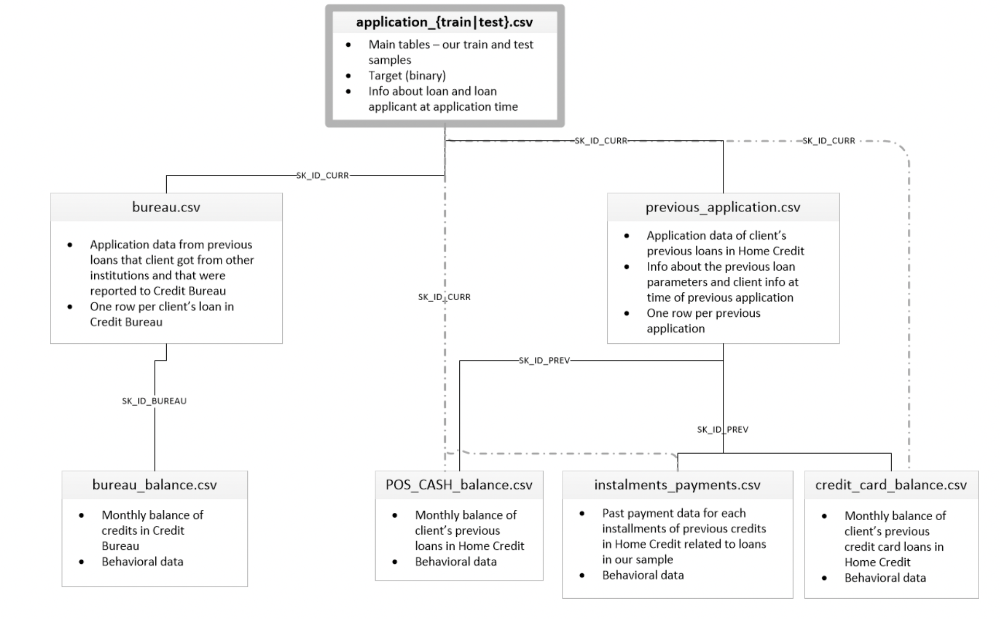

### Application train

> Indented block

In [11]:
import numpy as np
import pandas as pd 
from sklearn.preprocessing import LabelEncoder
import os
import zipfile
from sklearn.base import BaseEstimator, TransformerMixin
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline, FeatureUnion
from pandas.plotting import scatter_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
import warnings
warnings.filterwarnings('ignore')

def load_data(in_path, name):
    df = pd.read_csv(in_path)
    print(f"{name}: shape is {df.shape}")
    print(df.info())
    display(df.head(5))
    return df

datasets={}  # lets store the datasets in a dictionary so we can keep track of them easily
ds_name = 'application_train'
datasets[ds_name] = load_data(os.path.join(DATA_DIR, f'{ds_name}.csv'), ds_name)

datasets['application_train'].shape

application_train: shape is (307511, 122)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB
None


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


(307511, 122)

### Application test


* __application_train/application_test:__ the main training and testing data with information about each loan application at Home Credit. Every loan has its own row and is identified by the feature SK_ID_CURR. The training application data comes with the TARGET indicating __0: the loan was repaid__ or __1: the loan was not repaid__. The target variable defines if the client had payment difficulties meaning he/she had late payment more than X days on at least one of the first Y installments of the loan. Such case is marked as 1 while other all other cases as 0.


In [12]:
ds_name = 'application_test'
datasets[ds_name] = load_data(os.path.join(DATA_DIR, f'{ds_name}.csv'), ds_name)

application_test: shape is (48744, 121)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48744 entries, 0 to 48743
Columns: 121 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(40), object(16)
memory usage: 45.0+ MB
None


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


### The Other datasets

* __bureau:__ data concerning client's previous credits from other financial institutions. Each previous credit has its own row in bureau, but one loan in the application data can have multiple previous credits.
* __bureau_balance:__ monthly data about the previous credits in bureau. Each row is one month of a previous credit, and a single previous credit can have multiple rows, one for each month of the credit length.
* __previous_application:__ previous applications for loans at Home Credit of clients who have loans in the application data. Each current loan in the application data can have multiple previous loans. Each previous application has one row and is identified by the feature SK_ID_PREV.
* __POS_CASH_BALANCE:__ monthly data about previous point of sale or cash loans clients have had with Home Credit. Each row is one month of a previous point of sale or cash loan, and a single previous loan can have many rows.
* credit_card_balance: monthly data about previous credit cards clients have had with Home Credit. Each row is one month of a credit card balance, and a single credit card can have many rows.
* __installments_payment:__ payment history for previous loans at Home Credit. There is one row for every made payment and one row for every missed payment.

In [13]:
%%time
ds_names = ("application_train", "application_test", "bureau","bureau_balance","credit_card_balance","installments_payments",
            "previous_application","POS_CASH_balance")

for ds_name in ds_names:
    datasets[ds_name] = load_data(os.path.join(DATA_DIR, f'{ds_name}.csv'), ds_name)

application_train: shape is (307511, 122)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB
None


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


application_test: shape is (48744, 121)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48744 entries, 0 to 48743
Columns: 121 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(40), object(16)
memory usage: 45.0+ MB
None


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


bureau: shape is (1716428, 17)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1716428 entries, 0 to 1716427
Data columns (total 17 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   SK_ID_CURR              int64  
 1   SK_ID_BUREAU            int64  
 2   CREDIT_ACTIVE           object 
 3   CREDIT_CURRENCY         object 
 4   DAYS_CREDIT             int64  
 5   CREDIT_DAY_OVERDUE      int64  
 6   DAYS_CREDIT_ENDDATE     float64
 7   DAYS_ENDDATE_FACT       float64
 8   AMT_CREDIT_MAX_OVERDUE  float64
 9   CNT_CREDIT_PROLONG      int64  
 10  AMT_CREDIT_SUM          float64
 11  AMT_CREDIT_SUM_DEBT     float64
 12  AMT_CREDIT_SUM_LIMIT    float64
 13  AMT_CREDIT_SUM_OVERDUE  float64
 14  CREDIT_TYPE             object 
 15  DAYS_CREDIT_UPDATE      int64  
 16  AMT_ANNUITY             float64
dtypes: float64(8), int64(6), object(3)
memory usage: 222.6+ MB
None


,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN


bureau_balance: shape is (27299925, 3)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27299925 entries, 0 to 27299924
Data columns (total 3 columns):
 #   Column          Dtype 
---  ------          ----- 
 0   SK_ID_BUREAU    int64 
 1   MONTHS_BALANCE  int64 
 2   STATUS          object
dtypes: int64(2), object(1)
memory usage: 624.8+ MB
None


,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C


credit_card_balance: shape is (3840312, 23)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3840312 entries, 0 to 3840311
Data columns (total 23 columns):
 #   Column                      Dtype  
---  ------                      -----  
 0   SK_ID_PREV                  int64  
 1   SK_ID_CURR                  int64  
 2   MONTHS_BALANCE              int64  
 3   AMT_BALANCE                 float64
 4   AMT_CREDIT_LIMIT_ACTUAL     int64  
 5   AMT_DRAWINGS_ATM_CURRENT    float64
 6   AMT_DRAWINGS_CURRENT        float64
 7   AMT_DRAWINGS_OTHER_CURRENT  float64
 8   AMT_DRAWINGS_POS_CURRENT    float64
 9   AMT_INST_MIN_REGULARITY     float64
 10  AMT_PAYMENT_CURRENT         float64
 11  AMT_PAYMENT_TOTAL_CURRENT   float64
 12  AMT_RECEIVABLE_PRINCIPAL    float64
 13  AMT_RECIVABLE               float64
 14  AMT_TOTAL_RECEIVABLE        float64
 15  CNT_DRAWINGS_ATM_CURRENT    float64
 16  CNT_DRAWINGS_CURRENT        int64  
 17  CNT_DRAWINGS_OTHER_CURRENT  float64
 18  CNT_DRAWINGS_POS_C

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,...,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,...,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,...,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0
2,1740877,371185,-7,31815.225,450000,0.0,0.0,0.0,0.0,2250.000,...,31460.085,31460.085,0.0,0,0.0,0.0,30.0,Active,0,0
3,1389973,337855,-4,236572.110,225000,2250.0,2250.0,0.0,0.0,11795.760,...,233048.970,233048.970,1.0,1,0.0,0.0,10.0,Active,0,0
4,1891521,126868,-1,453919.455,450000,0.0,11547.0,0.0,11547.0,22924.890,...,453919.455,453919.455,0.0,1,0.0,1.0,101.0,Active,0,0


installments_payments: shape is (13605401, 8)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13605401 entries, 0 to 13605400
Data columns (total 8 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   SK_ID_PREV              int64  
 1   SK_ID_CURR              int64  
 2   NUM_INSTALMENT_VERSION  float64
 3   NUM_INSTALMENT_NUMBER   int64  
 4   DAYS_INSTALMENT         float64
 5   DAYS_ENTRY_PAYMENT      float64
 6   AMT_INSTALMENT          float64
 7   AMT_PAYMENT             float64
dtypes: float64(5), int64(3)
memory usage: 830.4 MB
None


,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585


previous_application: shape is (1670214, 37)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_DOWN_PAYMENT             774370 non-null   float64
 7   AMT_GOODS_PRICE              1284699 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 9   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 10  FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 1

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,...,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


POS_CASH_balance: shape is (10001358, 8)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10001358 entries, 0 to 10001357
Data columns (total 8 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   SK_ID_PREV             int64  
 1   SK_ID_CURR             int64  
 2   MONTHS_BALANCE         int64  
 3   CNT_INSTALMENT         float64
 4   CNT_INSTALMENT_FUTURE  float64
 5   NAME_CONTRACT_STATUS   object 
 6   SK_DPD                 int64  
 7   SK_DPD_DEF             int64  
dtypes: float64(2), int64(5), object(1)
memory usage: 610.4+ MB
None


,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0
2,1784872,397406,-32,12.0,9.0,Active,0,0
3,1903291,269225,-35,48.0,42.0,Active,0,0
4,2341044,334279,-35,36.0,35.0,Active,0,0


CPU times: user 52.6 s, sys: 10.4 s, total: 1min 2s
Wall time: 1min 18s


In [14]:
for ds_name in datasets.keys():
    print(f'dataset {ds_name:24}: [ {datasets[ds_name].shape[0]:10,}, {datasets[ds_name].shape[1]}]')

dataset application_train       : [    307,511, 122]
dataset application_test        : [     48,744, 121]
dataset bureau                  : [  1,716,428, 17]
dataset bureau_balance          : [ 27,299,925, 3]
dataset credit_card_balance     : [  3,840,312, 23]
dataset installments_payments   : [ 13,605,401, 8]
dataset previous_application    : [  1,670,214, 37]
dataset POS_CASH_balance        : [ 10,001,358, 8]


# Exploratory Data Analysis

## Summary of Application train

In [165]:
datasets["application_train"].info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 122 columns):
 #    Column                        Non-Null Count   Dtype  
---   ------                        --------------   -----  
 0    SK_ID_CURR                    307511 non-null  int64  
 1    TARGET                        307511 non-null  int64  
 2    NAME_CONTRACT_TYPE            307511 non-null  object 
 3    CODE_GENDER                   307511 non-null  object 
 4    FLAG_OWN_CAR                  307511 non-null  object 
 5    FLAG_OWN_REALTY               307511 non-null  object 
 6    CNT_CHILDREN                  307511 non-null  int64  
 7    AMT_INCOME_TOTAL              307511 non-null  float64
 8    AMT_CREDIT                    307511 non-null  float64
 9    AMT_ANNUITY                   307499 non-null  float64
 10   AMT_GOODS_PRICE               307233 non-null  float64
 11   NAME_TYPE_SUITE               306219 non-null  object 
 12   NAME_INCOME_TYPE            

In [166]:
datasets["application_train"].shape

(307511, 122)

In [167]:
datasets["application_train"].size

37516342

In [168]:
datasets["application_train"].describe() #numerical only features

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,...,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,...,0.008130,0.000595,0.000507,0.000335,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974
std,102790.175348,0.272419,0.722121,2.371231e+05,4.024908e+05,14493.737315,3.694465e+05,0.013831,4363.988632,141275.766519,...,0.089798,0.024387,0.022518,0.018299,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295
min,100002.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,-25229.000000,-17912.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189145.500000,0.000000,0.000000,1.125000e+05,2.700000e+05,16524.000000,2.385000e+05,0.010006,-19682.000000,-2760.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,278202.000000,0.000000,0.000000,1.471500e+05,5.135310e+05,24903.000000,4.500000e+05,0.018850,-15750.000000,-1213.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,367142.500000,0.000000,1.000000,2.025000e+05,8.086500e+05,34596.000000,6.795000e+05,0.028663,-12413.000000,-289.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,456255.000000,1.000000,19.000000,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,-7489.000000,365243.000000,...,1.000000,1.000000,1.000000,1.000000,4.000000,9.000000,8.000000,27.000000,261.000000,25.000000


In [169]:
datasets["application_test"].describe() #numerical only features

,SK_ID_CURR,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,48744.000000,48744.000000,4.874400e+04,4.874400e+04,48720.000000,4.874400e+04,48744.000000,48744.000000,48744.000000,48744.000000,...,48744.000000,48744.0,48744.0,48744.0,42695.000000,42695.000000,42695.000000,42695.000000,42695.000000,42695.000000
mean,277796.676350,0.397054,1.784318e+05,5.167404e+05,29426.240209,4.626188e+05,0.021226,-16068.084605,67485.366322,-4967.652716,...,0.001559,0.0,0.0,0.0,0.002108,0.001803,0.002787,0.009299,0.546902,1.983769
std,103169.547296,0.709047,1.015226e+05,3.653970e+05,16016.368315,3.367102e+05,0.014428,4325.900393,144348.507136,3552.612035,...,0.039456,0.0,0.0,0.0,0.046373,0.046132,0.054037,0.110924,0.693305,1.838873
min,100001.000000,0.000000,2.694150e+04,4.500000e+04,2295.000000,4.500000e+04,0.000253,-25195.000000,-17463.000000,-23722.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,188557.750000,0.000000,1.125000e+05,2.606400e+05,17973.000000,2.250000e+05,0.010006,-19637.000000,-2910.000000,-7459.250000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,277549.000000,0.000000,1.575000e+05,4.500000e+05,26199.000000,3.960000e+05,0.018850,-15785.000000,-1293.000000,-4490.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
75%,367555.500000,1.000000,2.250000e+05,6.750000e+05,37390.500000,6.300000e+05,0.028663,-12496.000000,-296.000000,-1901.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,1.000000,3.000000
max,456250.000000,20.000000,4.410000e+06,2.245500e+06,180576.000000,2.245500e+06,0.072508,-7338.000000,365243.000000,0.000000,...,1.000000,0.0,0.0,0.0,2.000000,2.000000,2.000000,6.000000,7.000000,17.000000


In [170]:
datasets["application_train"].head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [171]:
#datasets["application_test"].describe() #numerical only features

In [172]:
datasets["application_train"].describe(include='all') #look at all categorical and numerical

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511,307511,307511,307511,307511.000000,3.075110e+05,3.075110e+05,307499.000000,...,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
unique,NaN,NaN,2,3,2,2,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,Cash loans,F,N,Y,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,278232,202448,202924,213312,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,278180.518577,0.080729,NaN,NaN,NaN,NaN,0.417052,1.687979e+05,5.990260e+05,27108.573909,...,0.008130,0.000595,0.000507,0.000335,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974
std,102790.175348,0.272419,NaN,NaN,NaN,NaN,0.722121,2.371231e+05,4.024908e+05,14493.737315,...,0.089798,0.024387,0.022518,0.018299,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295
min,100002.000000,0.000000,NaN,NaN,NaN,NaN,0.000000,2.565000e+04,4.500000e+04,1615.500000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189145.500000,0.000000,NaN,NaN,NaN,NaN,0.000000,1.125000e+05,2.700000e+05,16524.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,278202.000000,0.000000,NaN,NaN,NaN,NaN,0.000000,1.471500e+05,5.135310e+05,24903.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,367142.500000,0.000000,NaN,NaN,NaN,NaN,1.000000,2.025000e+05,8.086500e+05,34596.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000


In [173]:
#df_app_train= pd.read_csv (r'/Users/nanda/Downloads/home-credit-default-risk/application_train.csv')

In [174]:
print("Different datatypes in Apllication_train dataset")
datasets["application_train"].dtypes.value_counts()

Different datatypes in Apllication_train dataset


float64    65
int64      41
object     16
dtype: int64

In [175]:
columns= datasets["application_train"].columns
print(columns)

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY',
       ...
       'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20',
       'FLAG_DOCUMENT_21', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR'],
      dtype='object', length=122)


In [176]:
# i=0
for key in datasets["application_train"].keys():
    n=len(pd.unique(datasets["application_train"][key]))
    print('Nunber of Unique values in ', format(key), 'is', format(n))
#     i=i+1
# print(i)

Nunber of Unique values in  SK_ID_CURR is 307511
Nunber of Unique values in  TARGET is 2
Nunber of Unique values in  NAME_CONTRACT_TYPE is 2
Nunber of Unique values in  CODE_GENDER is 3
Nunber of Unique values in  FLAG_OWN_CAR is 2
Nunber of Unique values in  FLAG_OWN_REALTY is 2
Nunber of Unique values in  CNT_CHILDREN is 15
Nunber of Unique values in  AMT_INCOME_TOTAL is 2548
Nunber of Unique values in  AMT_CREDIT is 5603
Nunber of Unique values in  AMT_ANNUITY is 13673
Nunber of Unique values in  AMT_GOODS_PRICE is 1003
Nunber of Unique values in  NAME_TYPE_SUITE is 8
Nunber of Unique values in  NAME_INCOME_TYPE is 8
Nunber of Unique values in  NAME_EDUCATION_TYPE is 5
Nunber of Unique values in  NAME_FAMILY_STATUS is 6
Nunber of Unique values in  NAME_HOUSING_TYPE is 6
Nunber of Unique values in  REGION_POPULATION_RELATIVE is 81
Nunber of Unique values in  DAYS_BIRTH is 17460
Nunber of Unique values in  DAYS_EMPLOYED is 12574
Nunber of Unique values in  DAYS_REGISTRATION is 15688
N

In [177]:
datasets["application_train"].isnull().head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,True,True,True,True,True,True
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [178]:
s = datasets["application_train"].isnull().sum()

In [179]:
print("Shows all the coulumns ")
s[s!=0]

Shows all the coulumns 


AMT_ANNUITY                       12
AMT_GOODS_PRICE                  278
NAME_TYPE_SUITE                 1292
OWN_CAR_AGE                   202929
OCCUPATION_TYPE                96391
                               ...  
AMT_REQ_CREDIT_BUREAU_DAY      41519
AMT_REQ_CREDIT_BUREAU_WEEK     41519
AMT_REQ_CREDIT_BUREAU_MON      41519
AMT_REQ_CREDIT_BUREAU_QRT      41519
AMT_REQ_CREDIT_BUREAU_YEAR     41519
Length: 67, dtype: int64

## Splitting categorical and numerical features

In [180]:
##num_columns = datasets["application_train"].select_dtypes(include = ['int64', 'float64']).columns
##print(f"\n Numerical columns in Application_train : {list(num_columns)}")
categorical_columns = []
for col in datasets["application_train"]:
        if datasets["application_train"][col].dtype == 'object' or datasets["application_train"][col].dtype == 'bool':
            categorical_columns.append(col)
print("Categorical columns in dataset: Application train", categorical_columns)


Categorical columns in dataset: Application train ['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE', 'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE', 'FONDKAPREMONT_MODE', 'HOUSETYPE_MODE', 'WALLSMATERIAL_MODE', 'EMERGENCYSTATE_MODE']


In [181]:
num_columns = []
for col in datasets["application_train"]:
        if datasets["application_train"][col].dtype == 'int64' or datasets["application_train"][col].dtype == 'float64':
            num_columns.append(col)
print("Numerical columns in dataset: Application train", num_columns)

Numerical columns in dataset: Application train ['SK_ID_CURR', 'TARGET', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'APARTMENTS_AVG', 'BASEMENTAREA_AVG', 'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BUILD_AVG', 'COMMONAREA_AVG', 'ELEVATORS_AVG', 'ENTRANCES_AVG', 'FLOORSMAX_AVG', 'FLOORSMIN_AVG', 'LANDAREA_AVG', 'LIVINGAPARTMENTS_AVG', 'LIVINGAREA_AVG', 'NONLIVINGAPARTMENTS_AVG', 'NONLIVINGAREA_AVG', 'APARTMENTS_MODE', 'BASEMENTA

### Splitting Application train data

In [182]:
X = datasets["application_train"].drop(['TARGET'], axis = 1)
y = datasets["application_train"]["TARGET"]
X_train_1, X_test_1, y_train_1, y_test_1 = train_test_split(X, y, test_size=0.30, random_state=50)
X_train_1, X_valid_1, y_train_1, y_valid_1 = train_test_split(X_train_1, y_train_1, test_size=0.3, random_state=50)
print(f"Shape of X train: {X_train_1.shape}")
print(f"Shape of X validation: {X_valid_1.shape}")
print(f"Shape of X test: {X_test_1.shape}")

Shape of X train: (150679, 121)
Shape of X validation: (64578, 121)
Shape of X test: (92254, 121)


In [183]:
X_train_1.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 150679 entries, 285945 to 43103
Data columns (total 121 columns):
 #    Column                        Non-Null Count   Dtype  
---   ------                        --------------   -----  
 0    SK_ID_CURR                    150679 non-null  int64  
 1    NAME_CONTRACT_TYPE            150679 non-null  object 
 2    CODE_GENDER                   150679 non-null  object 
 3    FLAG_OWN_CAR                  150679 non-null  object 
 4    FLAG_OWN_REALTY               150679 non-null  object 
 5    CNT_CHILDREN                  150679 non-null  int64  
 6    AMT_INCOME_TOTAL              150679 non-null  float64
 7    AMT_CREDIT                    150679 non-null  float64
 8    AMT_ANNUITY                   150674 non-null  float64
 9    AMT_GOODS_PRICE               150549 non-null  float64
 10   NAME_TYPE_SUITE               150028 non-null  object 
 11   NAME_INCOME_TYPE              150679 non-null  object 
 12   NAME_EDUCATION_TYPE     

## Missing data for application train

In [184]:

def missing_value_info_plot(df, df_name):
    percent = (df.isnull().sum()/df.isnull().count()*100).sort_values(ascending = False).round(2)
    sum_missing = df.isna().sum().sort_values(ascending = False)
    missing_data  = pd.concat([percent, sum_missing], axis=1, keys=['Percent', "Train Missing Count"])
    missing_data = missing_data[missing_data['Percent'] > 0]
    if len(missing_data) > 0: 
        a,x=plt.subplots(figsize=(8,10))
        f = sns.barplot(missing_data['Percent'],missing_data.index)
        plt.title('Plot for missing value')
        plt.xlabel('Missing values percent', fontsize = 1)
        plt.ylabel('Features',fontsize = 12)
    return missing_data.head(20)


,Percent,Train Missing Count
COMMONAREA_MEDI,69.87,214865
COMMONAREA_AVG,69.87,214865
COMMONAREA_MODE,69.87,214865
NONLIVINGAPARTMENTS_MODE,69.43,213514
NONLIVINGAPARTMENTS_AVG,69.43,213514
NONLIVINGAPARTMENTS_MEDI,69.43,213514
FONDKAPREMONT_MODE,68.39,210295
LIVINGAPARTMENTS_MODE,68.35,210199
LIVINGAPARTMENTS_AVG,68.35,210199
LIVINGAPARTMENTS_MEDI,68.35,210199


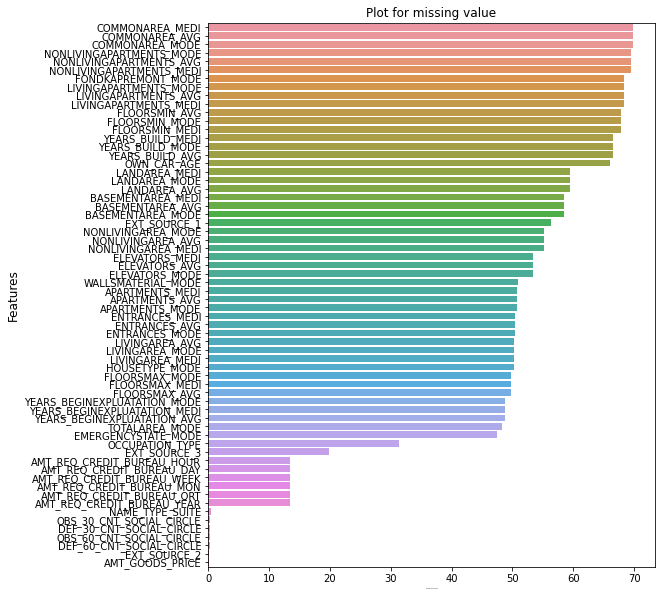

In [185]:
missing_value_info_plot(datasets['application_train'], 'application_train')

## Distribution of the target column 

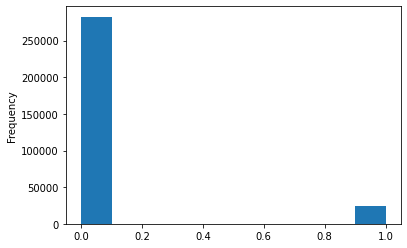

In [186]:
datasets["application_train"]['TARGET'].astype(int).plot.hist();

## Correlation with  the target column 

In [187]:
correlations = datasets["application_train"].corr()['TARGET'].sort_values()
print('Most Positive Correlations:\n', correlations.tail(10))
print('\nMost Negative Correlations:\n', correlations.head(10))

Most Positive Correlations:
 FLAG_DOCUMENT_3                0.044346
REG_CITY_NOT_LIVE_CITY         0.044395
FLAG_EMP_PHONE                 0.045982
REG_CITY_NOT_WORK_CITY         0.050994
DAYS_ID_PUBLISH                0.051457
DAYS_LAST_PHONE_CHANGE         0.055218
REGION_RATING_CLIENT           0.058899
REGION_RATING_CLIENT_W_CITY    0.060893
DAYS_BIRTH                     0.078239
TARGET                         1.000000
Name: TARGET, dtype: float64

Most Negative Correlations:
 EXT_SOURCE_3                 -0.178919
EXT_SOURCE_2                 -0.160472
EXT_SOURCE_1                 -0.155317
DAYS_EMPLOYED                -0.044932
FLOORSMAX_AVG                -0.044003
FLOORSMAX_MEDI               -0.043768
FLOORSMAX_MODE               -0.043226
AMT_GOODS_PRICE              -0.039645
REGION_POPULATION_RELATIVE   -0.037227
ELEVATORS_AVG                -0.034199
Name: TARGET, dtype: float64


In [188]:
numeric_features = datasets['application_train'][[
    'AMT_INCOME_TOTAL',  'AMT_CREDIT','DAYS_EMPLOYED','DAYS_BIRTH','EXT_SOURCE_1',
    'EXT_SOURCE_2','EXT_SOURCE_3', 'TARGET']]

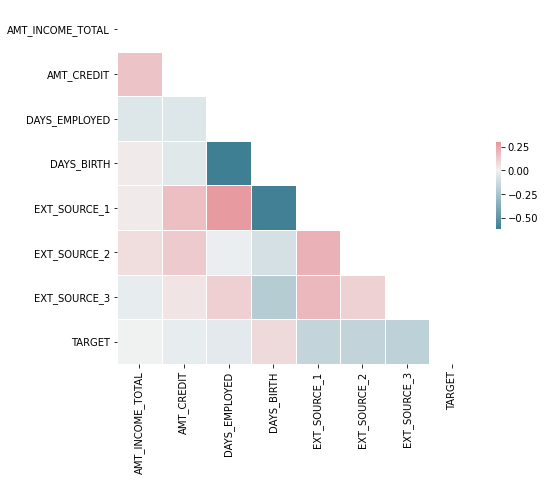

In [189]:
corr = numeric_features.corr()

mask = np.triu(np.ones_like(corr, dtype=np.bool))

f, ax = plt.subplots(figsize=(8, 8))

cmap = sns.diverging_palette(220, 10, as_cmap=True)

sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .2})
plt.show();


## Applicants Age 

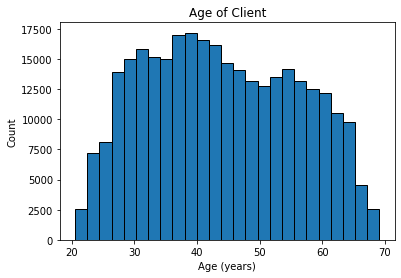

In [190]:
plt.hist(datasets["application_train"]['DAYS_BIRTH'] / -365, edgecolor = 'k', bins = 25)
plt.title('Age of Client'); plt.xlabel('Age (years)'); plt.ylabel('Count');

## Applicants occupations

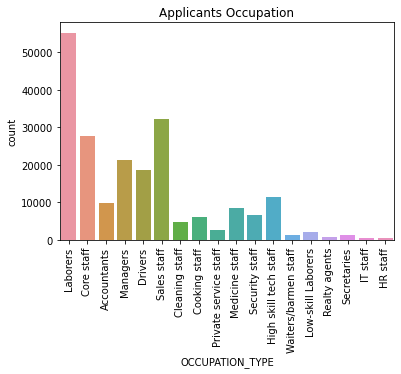

In [191]:
sns.countplot(x='OCCUPATION_TYPE', data=datasets["application_train"]);
plt.title('Applicants Occupation');
plt.xticks(rotation=90);

## VISUAL Exploratory Data Analysis

## Distribution of application train dataset

### Distribution of positively correlated features

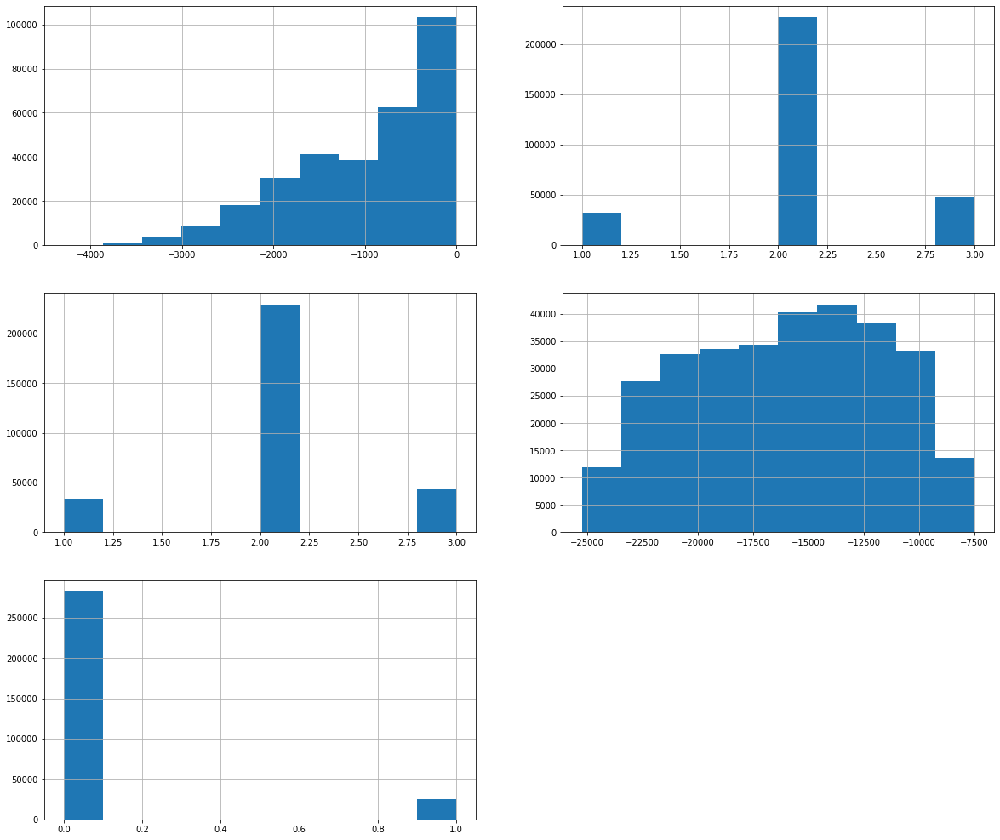

In [192]:
corr_pos = correlations.tail(5).index.values
shape = corr_pos.shape[0]
plt.figure(figsize = (20,30))
for a,b in enumerate(corr_pos):
    plt.subplot(shape,2,a+1)
    datasets["application_train"][b].hist()
plt.show()


### Distribution of negatively correlated features

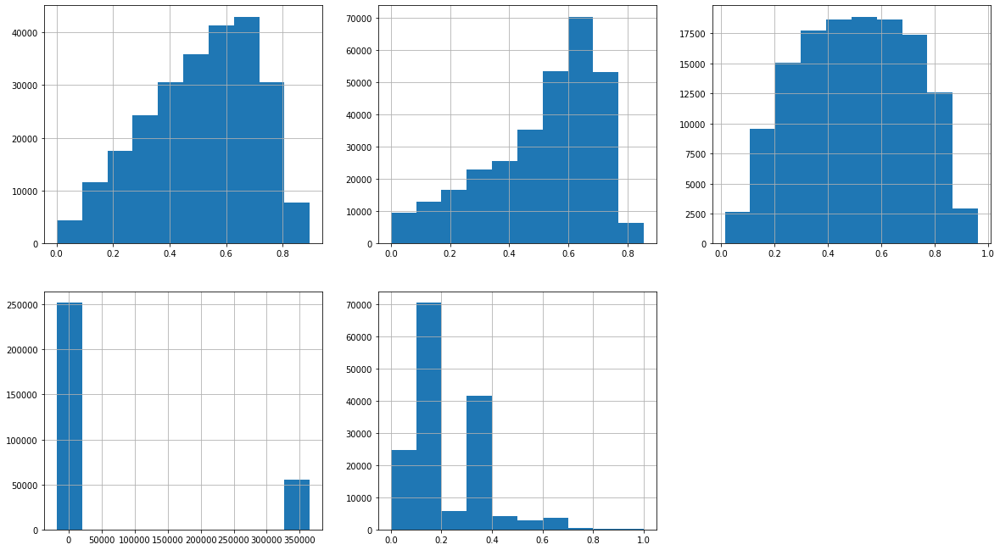

In [193]:
corr_pos = correlations.head(5).index.values
shape = corr_pos.shape[0]
plt.figure(figsize = (20,30))
for a,b in enumerate(corr_pos):
    plt.subplot(shape,3,a+1)
    datasets["application_train"][b].hist()
plt.show()



## Plots comparing target variables with input features. 

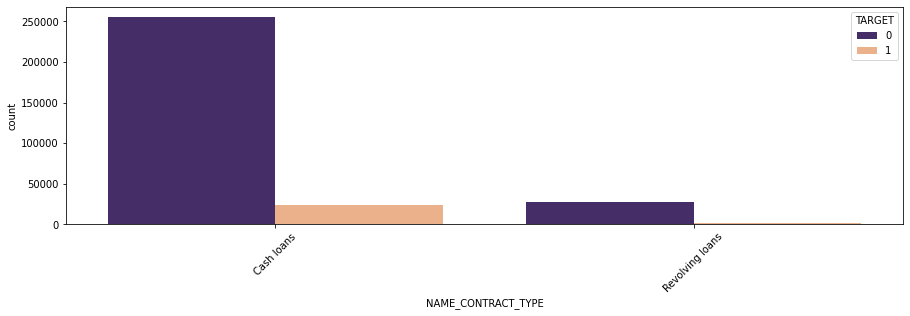

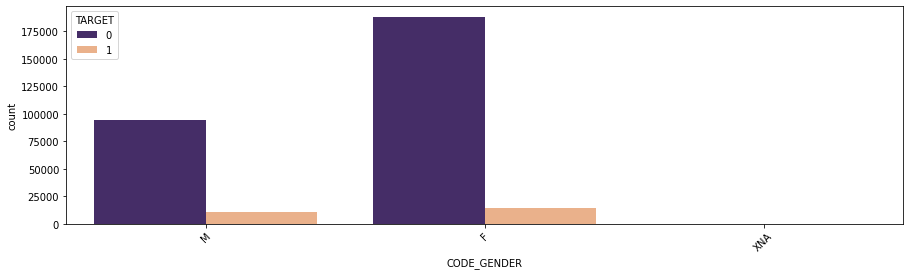

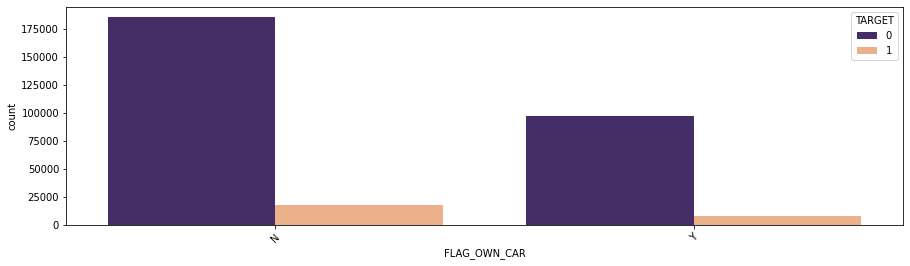

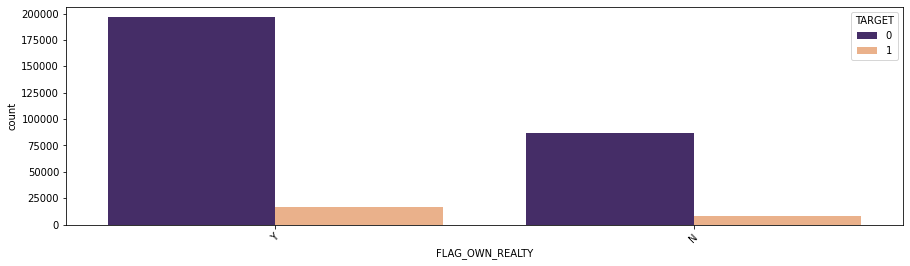

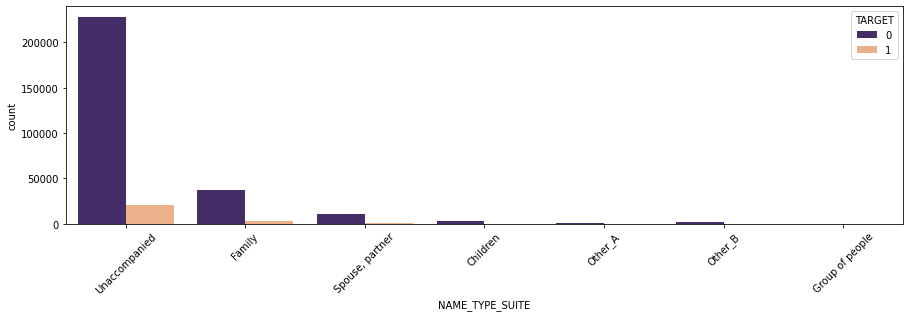

...

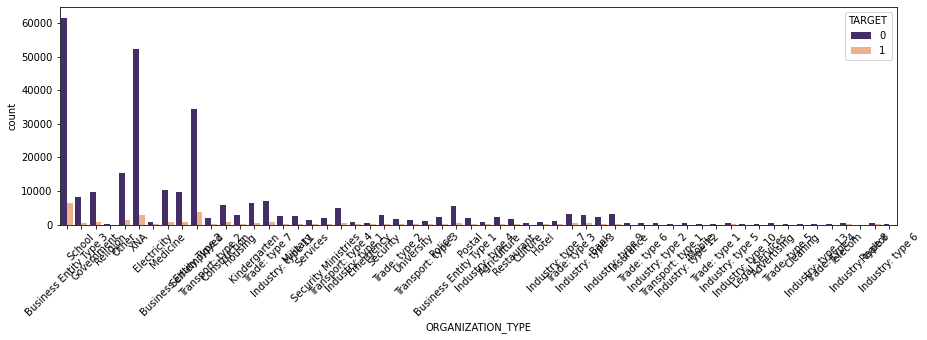

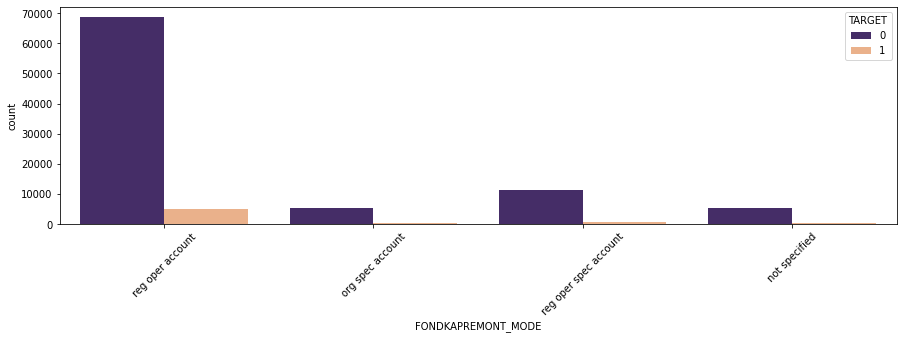

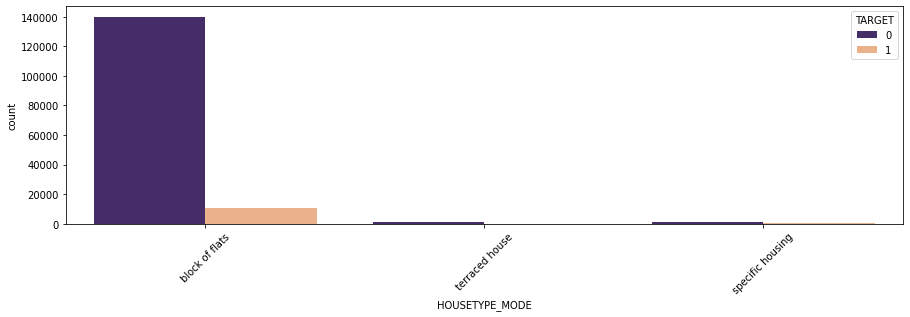

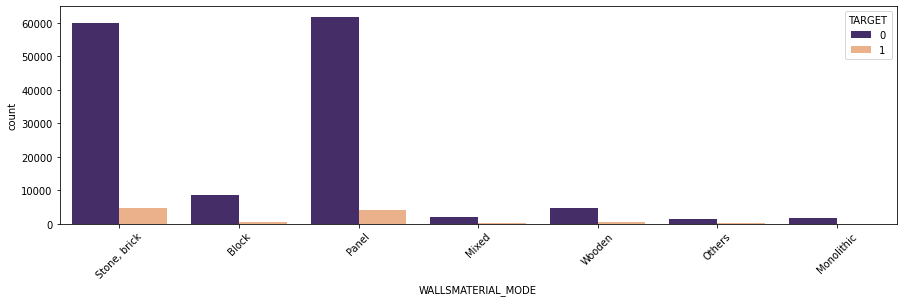

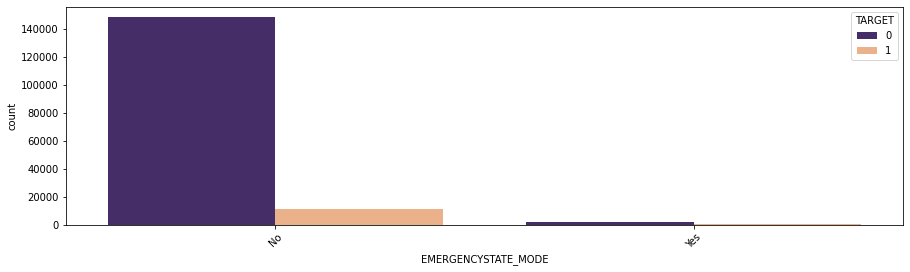

In [194]:
for categorical in categorical_columns:
    plt.figure(figsize=(15,4))
    g=plot = sns.countplot(x=datasets["application_train"][categorical],hue=datasets["application_train"]['TARGET']
                          , palette= ['#432371',"#FAAE7B"])
    g.set_xticklabels(g.get_xticklabels(), rotation=45)
    plt.show()

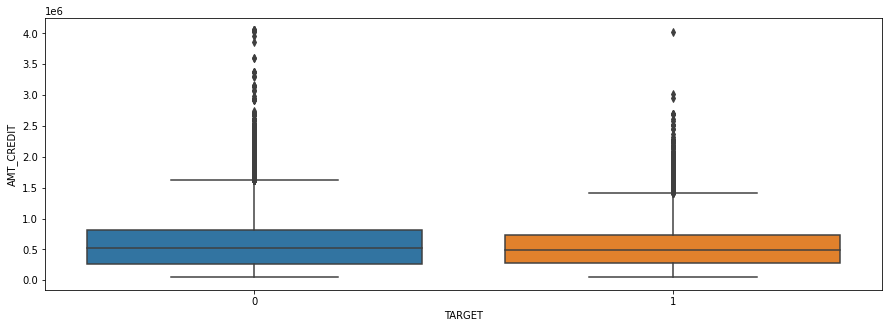

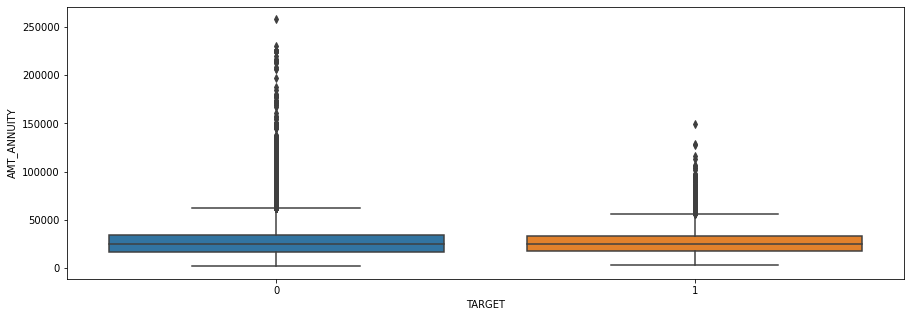

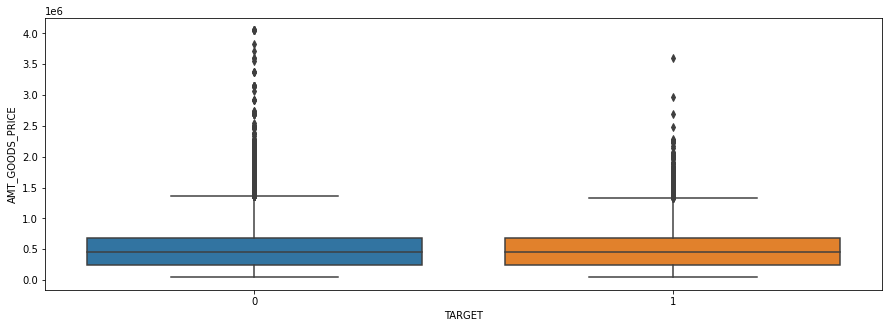

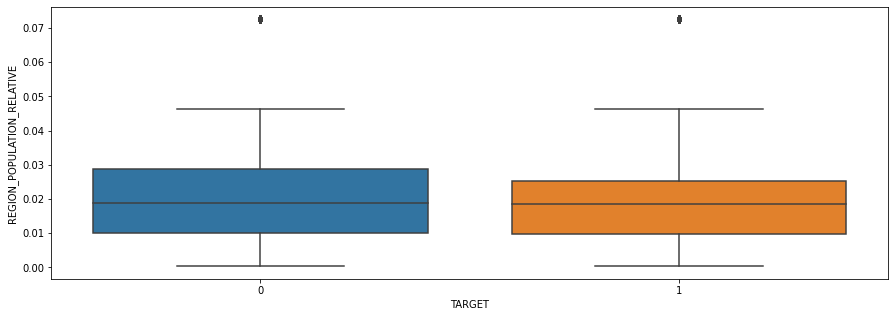

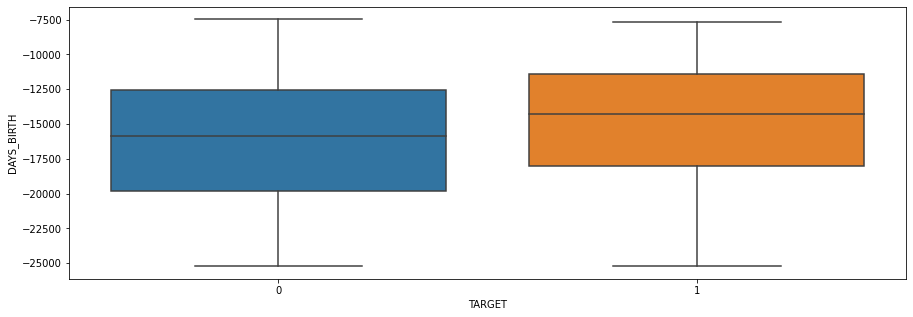

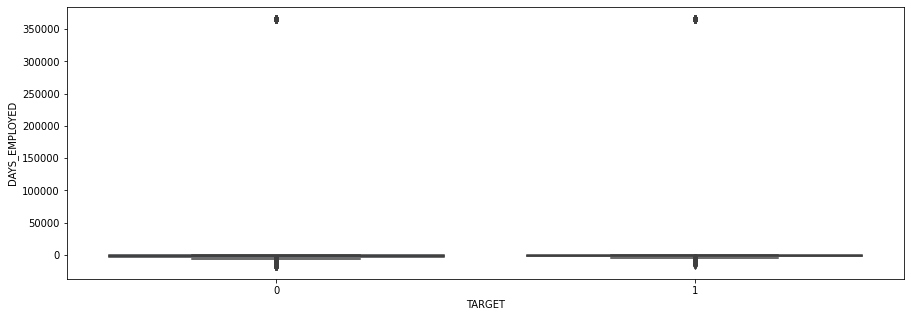

In [195]:

for numerical in num_columns[4:10]:
    plt.figure(figsize=(15,5))
    g=plot = sns.boxplot(x=datasets["application_train"]['TARGET'],  y=datasets["application_train"][numerical]
                        )
    plt.show()

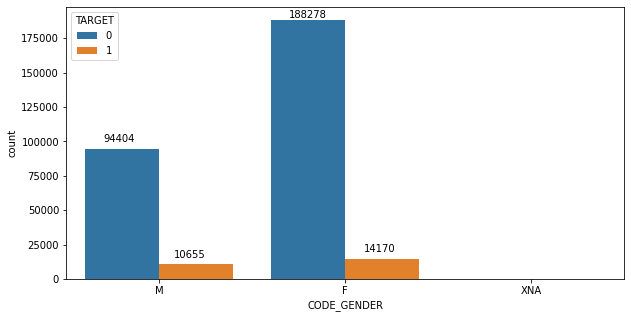

In [196]:
male_zero = datasets["application_train"].loc[(datasets["application_train"]["CODE_GENDER"]=="M")&(datasets["application_train"]["TARGET"]==0), :].count()[0]
male_one =  datasets["application_train"].loc[(datasets["application_train"]["CODE_GENDER"]=="M")&(datasets["application_train"]["TARGET"]==1), :].count()[0]
female_zero =  datasets["application_train"].loc[(datasets["application_train"]["CODE_GENDER"]=="F")&(datasets["application_train"]["TARGET"]==0), :].count()[0]
female_one =  datasets["application_train"].loc[(datasets["application_train"]["CODE_GENDER"]=="F")&(datasets["application_train"]["TARGET"]==1), :].count()[0]

plt.figure(figsize=(10,5))
sns.countplot(data=datasets["application_train"],x="CODE_GENDER", hue="TARGET", )
plt.text(-0.3,100000,male_zero)
plt.text(0.08,15000,male_one)
plt.text(0.7,190000,female_zero)
plt.text(1.1,20000,female_one)
plt.show()

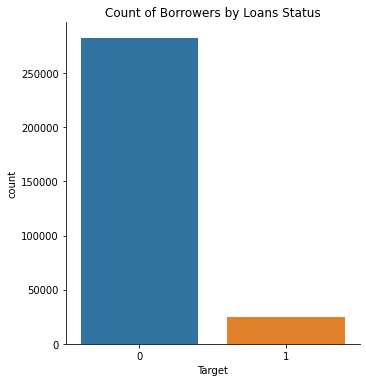

In [197]:
import seaborn as sns
sns.catplot(data= datasets["application_train"], x = 'TARGET', kind='count' )
plt.xlabel('Target')
plt.title('Count of Borrowers by Loans Status')
plt.show()

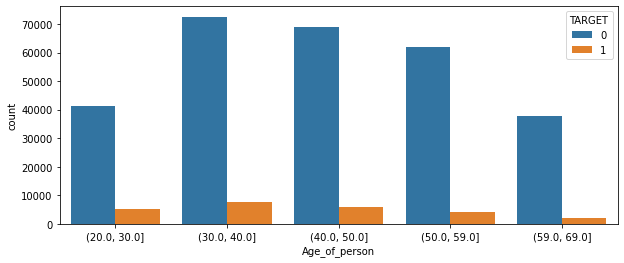

In [198]:
plt.figure(figsize=(10,4))
sns.countplot(data=datasets["application_train"],x=pd.cut(datasets["application_train"].DAYS_BIRTH/-365.25, bins=5,precision=0, right=True,retbins=False), hue="TARGET")
plt.xlabel('Age_of_person')
plt.show()

Observation: From the above graph, we can see that the people between age of 30 and 40 have maximum number who are              at risk.

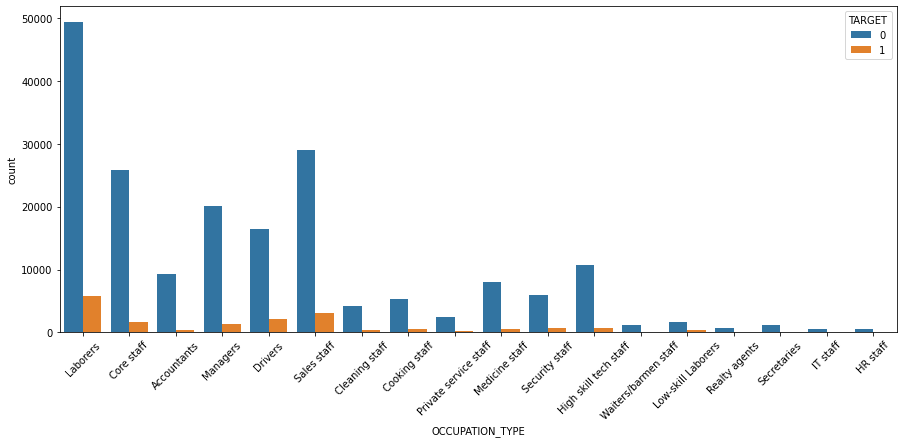

In [199]:
plt.figure(figsize=(15,6))
g=sns.countplot(data=datasets["application_train"], x="OCCUPATION_TYPE", hue="TARGET")
plt.xlabel('OCCUPATION_TYPE')
g.set_xticklabels(g.get_xticklabels(), rotation=45)
plt.show()


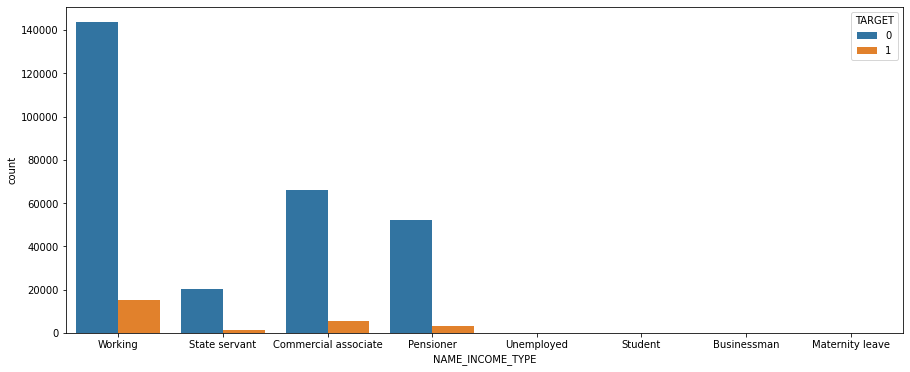

In [200]:
plt.figure(figsize=(15,6))
sns.countplot(data=datasets["application_train"], x="NAME_INCOME_TYPE", hue="TARGET")
plt.xlabel('NAME_INCOME_TYPE')
plt.show()

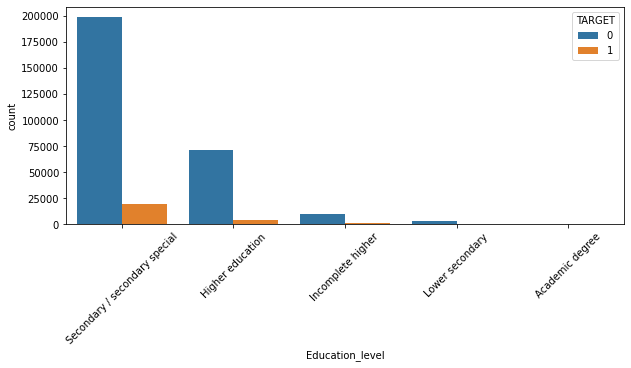

In [201]:
plt.figure(figsize=(10,4))
i=sns.countplot(data=datasets["application_train"],x="NAME_EDUCATION_TYPE", hue="TARGET",)
plt.xlabel('Education_level')
i.set_xticklabels(i.get_xticklabels(), rotation=45)
plt.show()

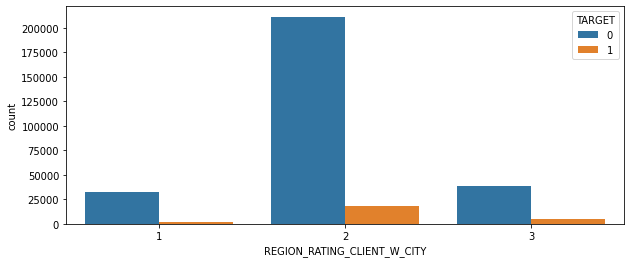

In [202]:
plt.figure(figsize=(10,4))
i=sns.countplot(data=datasets["application_train"],x="REGION_RATING_CLIENT_W_CITY", hue="TARGET",)
plt.xlabel('REGION_RATING_CLIENT_W_CITY')
plt.show()

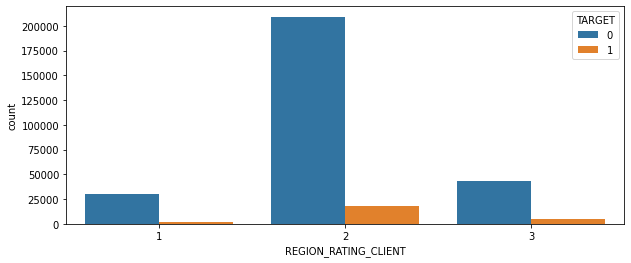

In [203]:
plt.figure(figsize=(10,4))
i=sns.countplot(data=datasets["application_train"],x="REGION_RATING_CLIENT", hue="TARGET",)
plt.xlabel('REGION_RATING_CLIENT')
plt.show()

## Summary of bureau

In [204]:
datasets["bureau"].info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1716428 entries, 0 to 1716427
Data columns (total 17 columns):
 #   Column                  Non-Null Count    Dtype  
---  ------                  --------------    -----  
 0   SK_ID_CURR              1716428 non-null  int64  
 1   SK_ID_BUREAU            1716428 non-null  int64  
 2   CREDIT_ACTIVE           1716428 non-null  object 
 3   CREDIT_CURRENCY         1716428 non-null  object 
 4   DAYS_CREDIT             1716428 non-null  int64  
 5   CREDIT_DAY_OVERDUE      1716428 non-null  int64  
 6   DAYS_CREDIT_ENDDATE     1610875 non-null  float64
 7   DAYS_ENDDATE_FACT       1082775 non-null  float64
 8   AMT_CREDIT_MAX_OVERDUE  591940 non-null   float64
 9   CNT_CREDIT_PROLONG      1716428 non-null  int64  
 10  AMT_CREDIT_SUM          1716415 non-null  float64
 11  AMT_CREDIT_SUM_DEBT     1458759 non-null  float64
 12  AMT_CREDIT_SUM_LIMIT    1124648 non-null  float64
 13  AMT_CREDIT_SUM_OVERDUE  1716428 non-null  float64
 14  CR

In [205]:
datasets["bureau"].shape

(1716428, 17)

In [206]:
datasets["bureau"].size

29179276

In [207]:
datasets["bureau"].head()

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN


In [208]:
datasets["bureau"].describe()

,SK_ID_CURR,SK_ID_BUREAU,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
count,1.716428e+06,1.716428e+06,1.716428e+06,1.716428e+06,1.610875e+06,1.082775e+06,5.919400e+05,1.716428e+06,1.716415e+06,1.458759e+06,1.124648e+06,1.716428e+06,1.716428e+06,4.896370e+05
mean,2.782149e+05,5.924434e+06,-1.142108e+03,8.181666e-01,5.105174e+02,-1.017437e+03,3.825418e+03,6.410406e-03,3.549946e+05,1.370851e+05,6.229515e+03,3.791276e+01,-5.937483e+02,1.571276e+04
std,1.029386e+05,5.322657e+05,7.951649e+02,3.654443e+01,4.994220e+03,7.140106e+02,2.060316e+05,9.622391e-02,1.149811e+06,6.774011e+05,4.503203e+04,5.937650e+03,7.207473e+02,3.258269e+05
min,1.000010e+05,5.000000e+06,-2.922000e+03,0.000000e+00,-4.206000e+04,-4.202300e+04,0.000000e+00,0.000000e+00,0.000000e+00,-4.705600e+06,-5.864061e+05,0.000000e+00,-4.194700e+04,0.000000e+00
25%,1.888668e+05,5.463954e+06,-1.666000e+03,0.000000e+00,-1.138000e+03,-1.489000e+03,0.000000e+00,0.000000e+00,5.130000e+04,0.000000e+00,0.000000e+00,0.000000e+00,-9.080000e+02,0.000000e+00
50%,2.780550e+05,5.926304e+06,-9.870000e+02,0.000000e+00,-3.300000e+02,-8.970000e+02,0.000000e+00,0.000000e+00,1.255185e+05,0.000000e+00,0.000000e+00,0.000000e+00,-3.950000e+02,0.000000e+00
75%,3.674260e+05,6.385681e+06,-4.740000e+02,0.000000e+00,4.740000e+02,-4.250000e+02,0.000000e+00,0.000000e+00,3.150000e+05,4.015350e+04,0.000000e+00,0.000000e+00,-3.300000e+01,1.350000e+04
max,4.562550e+05,6.843457e+06,0.000000e+00,2.792000e+03,3.119900e+04,0.000000e+00,1.159872e+08,9.000000e+00,5.850000e+08,1.701000e+08,4.705600e+06,3.756681e+06,3.720000e+02,1.184534e+08


In [209]:
datasets["bureau"].describe(include='all')

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
count,1.716428e+06,1.716428e+06,1716428,1716428,1.716428e+06,1.716428e+06,1.610875e+06,1.082775e+06,5.919400e+05,1.716428e+06,1.716415e+06,1.458759e+06,1.124648e+06,1.716428e+06,1716428,1.716428e+06,4.896370e+05
unique,NaN,NaN,4,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15,NaN,NaN
top,NaN,NaN,Closed,currency 1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Consumer credit,NaN,NaN
freq,NaN,NaN,1079273,1715020,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1251615,NaN,NaN
mean,2.782149e+05,5.924434e+06,NaN,NaN,-1.142108e+03,8.181666e-01,5.105174e+02,-1.017437e+03,3.825418e+03,6.410406e-03,3.549946e+05,1.370851e+05,6.229515e+03,3.791276e+01,NaN,-5.937483e+02,1.571276e+04
std,1.029386e+05,5.322657e+05,NaN,NaN,7.951649e+02,3.654443e+01,4.994220e+03,7.140106e+02,2.060316e+05,9.622391e-02,1.149811e+06,6.774011e+05,4.503203e+04,5.937650e+03,NaN,7.207473e+02,3.258269e+05
min,1.000010e+05,5.000000e+06,NaN,NaN,-2.922000e+03,0.000000e+00,-4.206000e+04,-4.202300e+04,0.000000e+00,0.000000e+00,0.000000e+00,-4.705600e+06,-5.864061e+05,0.000000e+00,NaN,-4.194700e+04,0.000000e+00
25%,1.888668e+05,5.463954e+06,NaN,NaN,-1.666000e+03,0.000000e+00,-1.138000e+03,-1.489000e+03,0.000000e+00,0.000000e+00,5.130000e+04,0.000000e+00,0.000000e+00,0.000000e+00,NaN,-9.080000e+02,0.000000e+00
50%,2.780550e+05,5.926304e+06,NaN,NaN,-9.870000e+02,0.000000e+00,-3.300000e+02,-8.970000e+02,0.000000e+00,0.000000e+00,1.255185e+05,0.000000e+00,0.000000e+00,0.000000e+00,NaN,-3.950000e+02,0.000000e+00
75%,3.674260e+05,6.385681e+06,NaN,NaN,-4.740000e+02,0.000000e+00,4.740000e+02,-4.250000e+02,0.000000e+00,0.000000e+00,3.150000e+05,4.015350e+04,0.000000e+00,0.000000e+00,NaN,-3.300000e+01,1.350000e+04


In [210]:
print("Different datatypes in Apllication_train dataset")
datasets["bureau"].dtypes.value_counts()

Different datatypes in Apllication_train dataset


float64    8
int64      6
object     3
dtype: int64

In [211]:
bureau_columns= datasets["bureau"].columns
print(bureau_columns)

Index(['SK_ID_CURR', 'SK_ID_BUREAU', 'CREDIT_ACTIVE', 'CREDIT_CURRENCY',
       'DAYS_CREDIT', 'CREDIT_DAY_OVERDUE', 'DAYS_CREDIT_ENDDATE',
       'DAYS_ENDDATE_FACT', 'AMT_CREDIT_MAX_OVERDUE', 'CNT_CREDIT_PROLONG',
       'AMT_CREDIT_SUM', 'AMT_CREDIT_SUM_DEBT', 'AMT_CREDIT_SUM_LIMIT',
       'AMT_CREDIT_SUM_OVERDUE', 'CREDIT_TYPE', 'DAYS_CREDIT_UPDATE',
       'AMT_ANNUITY'],
      dtype='object')


In [212]:
for key in datasets["bureau"].keys():
    n=len(pd.unique(datasets["bureau"][key]))
    print('Nunber of Unique values in ', format(key), 'is', format(n))

Nunber of Unique values in  SK_ID_CURR is 305811
Nunber of Unique values in  SK_ID_BUREAU is 1716428
Nunber of Unique values in  CREDIT_ACTIVE is 4
Nunber of Unique values in  CREDIT_CURRENCY is 4
Nunber of Unique values in  DAYS_CREDIT is 2923
Nunber of Unique values in  CREDIT_DAY_OVERDUE is 942
Nunber of Unique values in  DAYS_CREDIT_ENDDATE is 14097
Nunber of Unique values in  DAYS_ENDDATE_FACT is 2918
Nunber of Unique values in  AMT_CREDIT_MAX_OVERDUE is 68252
Nunber of Unique values in  CNT_CREDIT_PROLONG is 10
Nunber of Unique values in  AMT_CREDIT_SUM is 236709
Nunber of Unique values in  AMT_CREDIT_SUM_DEBT is 226538
Nunber of Unique values in  AMT_CREDIT_SUM_LIMIT is 51727
Nunber of Unique values in  AMT_CREDIT_SUM_OVERDUE is 1616
Nunber of Unique values in  CREDIT_TYPE is 15
Nunber of Unique values in  DAYS_CREDIT_UPDATE is 2982
Nunber of Unique values in  AMT_ANNUITY is 40322


In [213]:
datasets["bureau"].isnull().head()

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,False,False,False,False,False,False,False,False,True,False,False,False,True,False,False,False,True
1,False,False,False,False,False,False,False,True,True,False,False,False,True,False,False,False,True
2,False,False,False,False,False,False,False,True,True,False,False,True,True,False,False,False,True
3,False,False,False,False,False,False,True,True,True,False,False,True,True,False,False,False,True
4,False,False,False,False,False,False,False,True,False,False,False,True,True,False,False,False,True


In [214]:
s = datasets["bureau"].isnull().sum()

In [215]:
s[s!=0]

DAYS_CREDIT_ENDDATE        105553
DAYS_ENDDATE_FACT          633653
AMT_CREDIT_MAX_OVERDUE    1124488
AMT_CREDIT_SUM                 13
AMT_CREDIT_SUM_DEBT        257669
AMT_CREDIT_SUM_LIMIT       591780
AMT_ANNUITY               1226791
dtype: int64

,Percent,Train Missing Count
AMT_ANNUITY,71.47,1226791
AMT_CREDIT_MAX_OVERDUE,65.51,1124488
DAYS_ENDDATE_FACT,36.92,633653
AMT_CREDIT_SUM_LIMIT,34.48,591780
AMT_CREDIT_SUM_DEBT,15.01,257669
DAYS_CREDIT_ENDDATE,6.15,105553


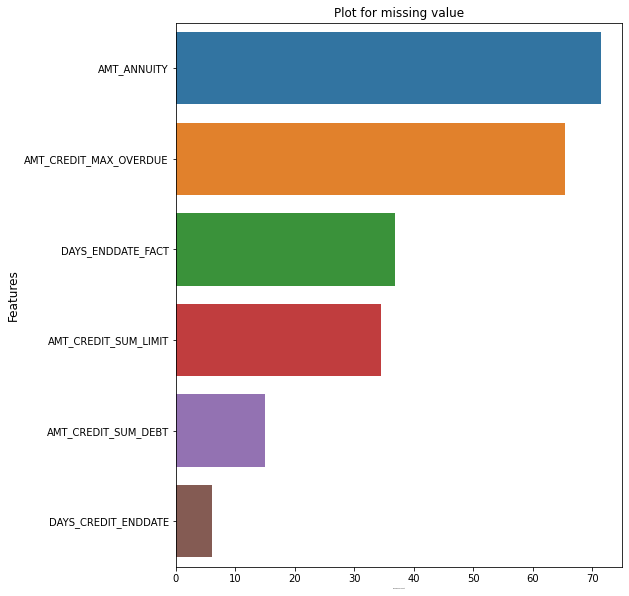

In [216]:
missing_value_info_plot(datasets['bureau'], 'bureau')

## Summary of bureau_balance

In [217]:
datasets["bureau_balance"].info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27299925 entries, 0 to 27299924
Data columns (total 3 columns):
 #   Column          Non-Null Count     Dtype 
---  ------          --------------     ----- 
 0   SK_ID_BUREAU    27299925 non-null  int64 
 1   MONTHS_BALANCE  27299925 non-null  int64 
 2   STATUS          27299925 non-null  object
dtypes: int64(2), object(1)
memory usage: 624.8+ MB


In [218]:
datasets["bureau_balance"].shape

(27299925, 3)

In [219]:
datasets["bureau_balance"].head()

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C


In [220]:
datasets["bureau_balance"].describe()

,SK_ID_BUREAU,MONTHS_BALANCE
count,2.729992e+07,2.729992e+07
mean,6.036297e+06,-3.074169e+01
std,4.923489e+05,2.386451e+01
min,5.001709e+06,-9.600000e+01
25%,5.730933e+06,-4.600000e+01
50%,6.070821e+06,-2.500000e+01
75%,6.431951e+06,-1.100000e+01
max,6.842888e+06,0.000000e+00


In [221]:
print("Different datatypes in bureau_balance dataset")
datasets["bureau_balance"].dtypes.value_counts()

Different datatypes in bureau_balance dataset


int64     2
object    1
dtype: int64

In [222]:
bureau_balance_columns= datasets["bureau_balance"].columns
print(bureau_balance_columns)

Index(['SK_ID_BUREAU', 'MONTHS_BALANCE', 'STATUS'], dtype='object')


In [223]:
for key in datasets["bureau_balance"].keys():
    n=len(pd.unique(datasets["bureau_balance"][key]))
    print('Nunber of Unique values in ', format(key), 'is', format(n))

Nunber of Unique values in  SK_ID_BUREAU is 817395
Nunber of Unique values in  MONTHS_BALANCE is 97
Nunber of Unique values in  STATUS is 8


In [224]:
s = datasets["bureau_balance"].isnull().sum()

In [225]:
s[s!=0]

Series([], dtype: int64)

#### Missing data for bureau_balance

In [226]:
missing_value_info_plot(datasets['bureau_balance'], 'bureau_balance')

,Percent,Train Missing Count


Observation: As we can observe, bureaua_balance has no missing data.

## Summary of Previous_application

In [227]:
datasets["previous_application"].info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_DOWN_PAYMENT             774370 non-null   float64
 7   AMT_GOODS_PRICE              1284699 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 9   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 10  FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 12  RATE_DOWN_PAYMENT            774370 non-nu

In [228]:
datasets["previous_application"].shape

(1670214, 37)

In [229]:
datasets["previous_application"].head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,...,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


In [230]:
datasets["previous_application"].describe()

,SK_ID_PREV,SK_ID_CURR,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,HOUR_APPR_PROCESS_START,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,...,RATE_INTEREST_PRIVILEGED,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
count,1.670214e+06,1.670214e+06,1.297979e+06,1.670214e+06,1.670213e+06,7.743700e+05,1.284699e+06,1.670214e+06,1.670214e+06,774370.000000,...,5951.000000,1.670214e+06,1.670214e+06,1.297984e+06,997149.000000,997149.000000,997149.000000,997149.000000,997149.000000,997149.000000
mean,1.923089e+06,2.783572e+05,1.595512e+04,1.752339e+05,1.961140e+05,6.697402e+03,2.278473e+05,1.248418e+01,9.964675e-01,0.079637,...,0.773503,-8.806797e+02,3.139511e+02,1.605408e+01,342209.855039,13826.269337,33767.774054,76582.403064,81992.343838,0.332570
std,5.325980e+05,1.028148e+05,1.478214e+04,2.927798e+05,3.185746e+05,2.092150e+04,3.153966e+05,3.334028e+00,5.932963e-02,0.107823,...,0.100879,7.790997e+02,7.127443e+03,1.456729e+01,88916.115834,72444.869708,106857.034789,149647.415123,153303.516729,0.471134
min,1.000001e+06,1.000010e+05,0.000000e+00,0.000000e+00,0.000000e+00,-9.000000e-01,0.000000e+00,0.000000e+00,0.000000e+00,-0.000015,...,0.373150,-2.922000e+03,-1.000000e+00,0.000000e+00,-2922.000000,-2892.000000,-2801.000000,-2889.000000,-2874.000000,0.000000
25%,1.461857e+06,1.893290e+05,6.321780e+03,1.872000e+04,2.416050e+04,0.000000e+00,5.084100e+04,1.000000e+01,1.000000e+00,0.000000,...,0.715645,-1.300000e+03,-1.000000e+00,6.000000e+00,365243.000000,-1628.000000,-1242.000000,-1314.000000,-1270.000000,0.000000
50%,1.923110e+06,2.787145e+05,1.125000e+04,7.104600e+04,8.054100e+04,1.638000e+03,1.123200e+05,1.200000e+01,1.000000e+00,0.051605,...,0.835095,-5.810000e+02,3.000000e+00,1.200000e+01,365243.000000,-831.000000,-361.000000,-537.000000,-499.000000,0.000000
75%,2.384280e+06,3.675140e+05,2.065842e+04,1.803600e+05,2.164185e+05,7.740000e+03,2.340000e+05,1.500000e+01,1.000000e+00,0.108909,...,0.852537,-2.800000e+02,8.200000e+01,2.400000e+01,365243.000000,-411.000000,129.000000,-74.000000,-44.000000,1.000000
max,2.845382e+06,4.562550e+05,4.180581e+05,6.905160e+06,6.905160e+06,3.060045e+06,6.905160e+06,2.300000e+01,1.000000e+00,1.000000,...,1.000000,-1.000000e+00,4.000000e+06,8.400000e+01,365243.000000,365243.000000,365243.000000,365243.000000,365243.000000,1.000000


In [231]:
print("Different datatypes in previous_application dataset")
datasets["previous_application"].dtypes.value_counts()

Different datatypes in previous_application dataset


object     16
float64    15
int64       6
dtype: int64

In [232]:
prev_columns= datasets["previous_application"].columns
print(prev_columns)

Index(['SK_ID_PREV', 'SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'AMT_ANNUITY',
       'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NFLAG_LAST_APPL_IN_DAY',
       'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
       'RATE_INTEREST_PRIVILEGED', 'NAME_CASH_LOAN_PURPOSE',
       'NAME_CONTRACT_STATUS', 'DAYS_DECISION', 'NAME_PAYMENT_TYPE',
       'CODE_REJECT_REASON', 'NAME_TYPE_SUITE', 'NAME_CLIENT_TYPE',
       'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE',
       'CHANNEL_TYPE', 'SELLERPLACE_AREA', 'NAME_SELLER_INDUSTRY',
       'CNT_PAYMENT', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION',
       'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION',
       'DAYS_LAST_DUE', 'DAYS_TERMINATION', 'NFLAG_INSURED_ON_APPROVAL'],
      dtype='object')


In [233]:
for key in datasets["previous_application"].keys():
    n=len(pd.unique(datasets["previous_application"][key]))
    print('Nunber of Unique values in ', format(key), 'is', format(n))

Nunber of Unique values in  SK_ID_PREV is 1670214
Nunber of Unique values in  SK_ID_CURR is 338857
Nunber of Unique values in  NAME_CONTRACT_TYPE is 4
Nunber of Unique values in  AMT_ANNUITY is 357960
Nunber of Unique values in  AMT_APPLICATION is 93885
Nunber of Unique values in  AMT_CREDIT is 86804
Nunber of Unique values in  AMT_DOWN_PAYMENT is 29279
Nunber of Unique values in  AMT_GOODS_PRICE is 93886
Nunber of Unique values in  WEEKDAY_APPR_PROCESS_START is 7
Nunber of Unique values in  HOUR_APPR_PROCESS_START is 24
Nunber of Unique values in  FLAG_LAST_APPL_PER_CONTRACT is 2
Nunber of Unique values in  NFLAG_LAST_APPL_IN_DAY is 2
Nunber of Unique values in  RATE_DOWN_PAYMENT is 207034
Nunber of Unique values in  RATE_INTEREST_PRIMARY is 149
Nunber of Unique values in  RATE_INTEREST_PRIVILEGED is 26
Nunber of Unique values in  NAME_CASH_LOAN_PURPOSE is 25
Nunber of Unique values in  NAME_CONTRACT_STATUS is 4
Nunber of Unique values in  DAYS_DECISION is 2922
Nunber of Unique values

In [234]:
s = datasets["previous_application"].isnull().sum()

In [235]:
s[s!=0]

AMT_ANNUITY                   372235
AMT_CREDIT                         1
AMT_DOWN_PAYMENT              895844
AMT_GOODS_PRICE               385515
RATE_DOWN_PAYMENT             895844
RATE_INTEREST_PRIMARY        1664263
RATE_INTEREST_PRIVILEGED     1664263
NAME_TYPE_SUITE               820405
CNT_PAYMENT                   372230
PRODUCT_COMBINATION              346
DAYS_FIRST_DRAWING            673065
DAYS_FIRST_DUE                673065
DAYS_LAST_DUE_1ST_VERSION     673065
DAYS_LAST_DUE                 673065
DAYS_TERMINATION              673065
NFLAG_INSURED_ON_APPROVAL     673065
dtype: int64

#### Missing data for application train

,Percent,Train Missing Count
RATE_INTEREST_PRIVILEGED,99.64,1664263
RATE_INTEREST_PRIMARY,99.64,1664263
AMT_DOWN_PAYMENT,53.64,895844
RATE_DOWN_PAYMENT,53.64,895844
NAME_TYPE_SUITE,49.12,820405
NFLAG_INSURED_ON_APPROVAL,40.30,673065
DAYS_TERMINATION,40.30,673065
DAYS_LAST_DUE,40.30,673065
DAYS_LAST_DUE_1ST_VERSION,40.30,673065
DAYS_FIRST_DUE,40.30,673065


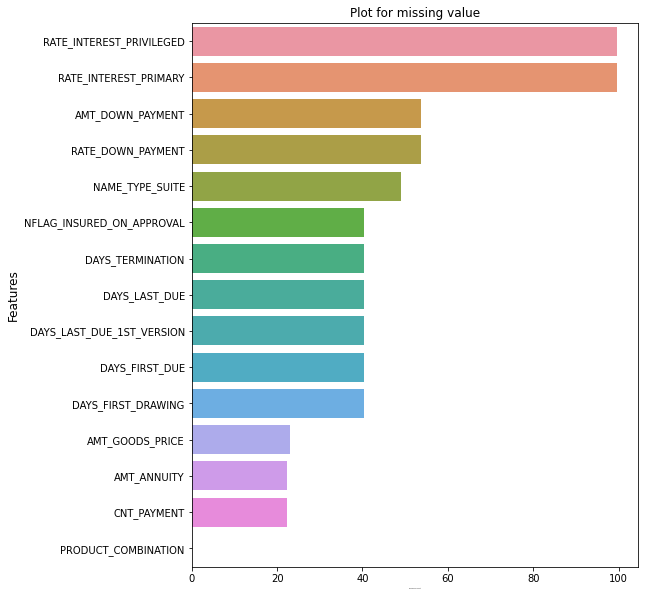

In [236]:
missing_value_info_plot(datasets['previous_application'], 'previous_application')

## Summary of POS_CASH_BALANCE

In [237]:
datasets["POS_CASH_balance"].info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10001358 entries, 0 to 10001357
Data columns (total 8 columns):
 #   Column                 Non-Null Count     Dtype  
---  ------                 --------------     -----  
 0   SK_ID_PREV             10001358 non-null  int64  
 1   SK_ID_CURR             10001358 non-null  int64  
 2   MONTHS_BALANCE         10001358 non-null  int64  
 3   CNT_INSTALMENT         9975287 non-null   float64
 4   CNT_INSTALMENT_FUTURE  9975271 non-null   float64
 5   NAME_CONTRACT_STATUS   10001358 non-null  object 
 6   SK_DPD                 10001358 non-null  int64  
 7   SK_DPD_DEF             10001358 non-null  int64  
dtypes: float64(2), int64(5), object(1)
memory usage: 610.4+ MB


In [238]:
datasets["POS_CASH_balance"].shape

(10001358, 8)

In [239]:
datasets["POS_CASH_balance"].head()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0
2,1784872,397406,-32,12.0,9.0,Active,0,0
3,1903291,269225,-35,48.0,42.0,Active,0,0
4,2341044,334279,-35,36.0,35.0,Active,0,0


In [240]:
datasets["POS_CASH_balance"].describe()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,SK_DPD,SK_DPD_DEF
count,1.000136e+07,1.000136e+07,1.000136e+07,9.975287e+06,9.975271e+06,1.000136e+07,1.000136e+07
mean,1.903217e+06,2.784039e+05,-3.501259e+01,1.708965e+01,1.048384e+01,1.160693e+01,6.544684e-01
std,5.358465e+05,1.027637e+05,2.606657e+01,1.199506e+01,1.110906e+01,1.327140e+02,3.276249e+01
min,1.000001e+06,1.000010e+05,-9.600000e+01,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,1.434405e+06,1.895500e+05,-5.400000e+01,1.000000e+01,3.000000e+00,0.000000e+00,0.000000e+00
50%,1.896565e+06,2.786540e+05,-2.800000e+01,1.200000e+01,7.000000e+00,0.000000e+00,0.000000e+00
75%,2.368963e+06,3.674290e+05,-1.300000e+01,2.400000e+01,1.400000e+01,0.000000e+00,0.000000e+00
max,2.843499e+06,4.562550e+05,-1.000000e+00,9.200000e+01,8.500000e+01,4.231000e+03,3.595000e+03


In [241]:
print("Different datatypes in POS_CASH_balance dataset")
datasets["POS_CASH_balance"].dtypes.value_counts()

Different datatypes in POS_CASH_balance dataset


int64      5
float64    2
object     1
dtype: int64

In [242]:
pos_columns= datasets["POS_CASH_balance"].columns
print(pos_columns)

Index(['SK_ID_PREV', 'SK_ID_CURR', 'MONTHS_BALANCE', 'CNT_INSTALMENT',
       'CNT_INSTALMENT_FUTURE', 'NAME_CONTRACT_STATUS', 'SK_DPD',
       'SK_DPD_DEF'],
      dtype='object')


In [243]:
for key in datasets["POS_CASH_balance"].keys():
    n=len(pd.unique(datasets["POS_CASH_balance"][key]))
    print('Nunber of Unique values in ', format(key), 'is', format(n))

Nunber of Unique values in  SK_ID_PREV is 936325
Nunber of Unique values in  SK_ID_CURR is 337252
Nunber of Unique values in  MONTHS_BALANCE is 96
Nunber of Unique values in  CNT_INSTALMENT is 74
Nunber of Unique values in  CNT_INSTALMENT_FUTURE is 80
Nunber of Unique values in  NAME_CONTRACT_STATUS is 9
Nunber of Unique values in  SK_DPD is 3400
Nunber of Unique values in  SK_DPD_DEF is 2307


In [244]:
s = datasets["POS_CASH_balance"].isnull().sum()

In [245]:
s[s!=0]

CNT_INSTALMENT           26071
CNT_INSTALMENT_FUTURE    26087
dtype: int64

#### Missing data for POS_CASH_balance

,Percent,Train Missing Count
CNT_INSTALMENT_FUTURE,0.26,26087
CNT_INSTALMENT,0.26,26071


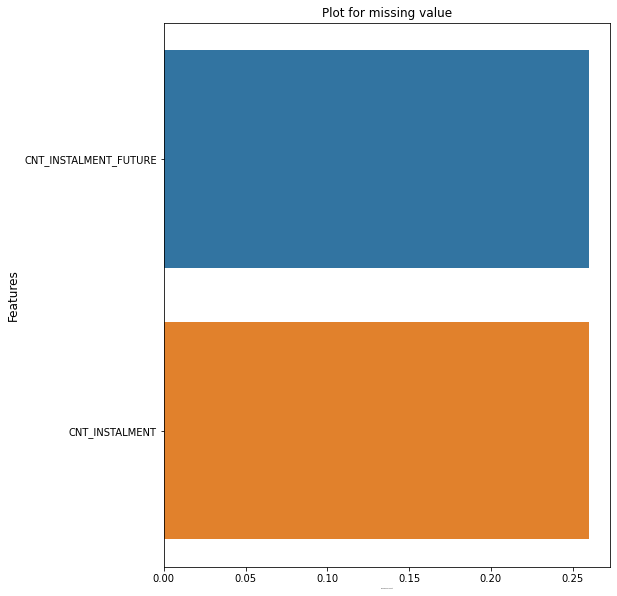

In [246]:
missing_value_info_plot(datasets['POS_CASH_balance'], 'POS_CASH_balance')

## Summary of credit_card_balance

In [247]:
datasets["credit_card_balance"].info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3840312 entries, 0 to 3840311
Data columns (total 23 columns):
 #   Column                      Non-Null Count    Dtype  
---  ------                      --------------    -----  
 0   SK_ID_PREV                  3840312 non-null  int64  
 1   SK_ID_CURR                  3840312 non-null  int64  
 2   MONTHS_BALANCE              3840312 non-null  int64  
 3   AMT_BALANCE                 3840312 non-null  float64
 4   AMT_CREDIT_LIMIT_ACTUAL     3840312 non-null  int64  
 5   AMT_DRAWINGS_ATM_CURRENT    3090496 non-null  float64
 6   AMT_DRAWINGS_CURRENT        3840312 non-null  float64
 7   AMT_DRAWINGS_OTHER_CURRENT  3090496 non-null  float64
 8   AMT_DRAWINGS_POS_CURRENT    3090496 non-null  float64
 9   AMT_INST_MIN_REGULARITY     3535076 non-null  float64
 10  AMT_PAYMENT_CURRENT         3072324 non-null  float64
 11  AMT_PAYMENT_TOTAL_CURRENT   3840312 non-null  float64
 12  AMT_RECEIVABLE_PRINCIPAL    3840312 non-null  float64
 1

In [248]:
datasets["credit_card_balance"].shape

(3840312, 23)

In [249]:
datasets["credit_card_balance"].head()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,...,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,...,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,...,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0
2,1740877,371185,-7,31815.225,450000,0.0,0.0,0.0,0.0,2250.000,...,31460.085,31460.085,0.0,0,0.0,0.0,30.0,Active,0,0
3,1389973,337855,-4,236572.110,225000,2250.0,2250.0,0.0,0.0,11795.760,...,233048.970,233048.970,1.0,1,0.0,0.0,10.0,Active,0,0
4,1891521,126868,-1,453919.455,450000,0.0,11547.0,0.0,11547.0,22924.890,...,453919.455,453919.455,0.0,1,0.0,1.0,101.0,Active,0,0


In [250]:
datasets["credit_card_balance"].describe()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,...,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,SK_DPD,SK_DPD_DEF
count,3.840312e+06,3.840312e+06,3.840312e+06,3.840312e+06,3.840312e+06,3.090496e+06,3.840312e+06,3.090496e+06,3.090496e+06,3.535076e+06,...,3.840312e+06,3.840312e+06,3.840312e+06,3.090496e+06,3.840312e+06,3.090496e+06,3.090496e+06,3.535076e+06,3.840312e+06,3.840312e+06
mean,1.904504e+06,2.783242e+05,-3.452192e+01,5.830016e+04,1.538080e+05,5.961325e+03,7.433388e+03,2.881696e+02,2.968805e+03,3.540204e+03,...,5.596588e+04,5.808881e+04,5.809829e+04,3.094490e-01,7.031439e-01,4.812496e-03,5.594791e-01,2.082508e+01,9.283667e+00,3.316220e-01
std,5.364695e+05,1.027045e+05,2.666775e+01,1.063070e+05,1.651457e+05,2.822569e+04,3.384608e+04,8.201989e+03,2.079689e+04,5.600154e+03,...,1.025336e+05,1.059654e+05,1.059718e+05,1.100401e+00,3.190347e+00,8.263861e-02,3.240649e+00,2.005149e+01,9.751570e+01,2.147923e+01
min,1.000018e+06,1.000060e+05,-9.600000e+01,-4.202502e+05,0.000000e+00,-6.827310e+03,-6.211620e+03,0.000000e+00,0.000000e+00,0.000000e+00,...,-4.233058e+05,-4.202502e+05,-4.202502e+05,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,1.434385e+06,1.895170e+05,-5.500000e+01,0.000000e+00,4.500000e+04,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,4.000000e+00,0.000000e+00,0.000000e+00
50%,1.897122e+06,2.783960e+05,-2.800000e+01,0.000000e+00,1.125000e+05,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.500000e+01,0.000000e+00,0.000000e+00
75%,2.369328e+06,3.675800e+05,-1.100000e+01,8.904669e+04,1.800000e+05,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,6.633911e+03,...,8.535924e+04,8.889949e+04,8.891451e+04,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,3.200000e+01,0.000000e+00,0.000000e+00
max,2.843496e+06,4.562500e+05,-1.000000e+00,1.505902e+06,1.350000e+06,2.115000e+06,2.287098e+06,1.529847e+06,2.239274e+06,2.028820e+05,...,1.472317e+06,1.493338e+06,1.493338e+06,5.100000e+01,1.650000e+02,1.200000e+01,1.650000e+02,1.200000e+02,3.260000e+03,3.260000e+03


In [251]:
print("Different datatypes in credit_card_balance dataset")
datasets["credit_card_balance"].dtypes.value_counts()

Different datatypes in credit_card_balance dataset


float64    15
int64       7
object      1
dtype: int64

In [252]:
credit_columns= datasets["credit_card_balance"].columns
print(credit_columns)

Index(['SK_ID_PREV', 'SK_ID_CURR', 'MONTHS_BALANCE', 'AMT_BALANCE',
       'AMT_CREDIT_LIMIT_ACTUAL', 'AMT_DRAWINGS_ATM_CURRENT',
       'AMT_DRAWINGS_CURRENT', 'AMT_DRAWINGS_OTHER_CURRENT',
       'AMT_DRAWINGS_POS_CURRENT', 'AMT_INST_MIN_REGULARITY',
       'AMT_PAYMENT_CURRENT', 'AMT_PAYMENT_TOTAL_CURRENT',
       'AMT_RECEIVABLE_PRINCIPAL', 'AMT_RECIVABLE', 'AMT_TOTAL_RECEIVABLE',
       'CNT_DRAWINGS_ATM_CURRENT', 'CNT_DRAWINGS_CURRENT',
       'CNT_DRAWINGS_OTHER_CURRENT', 'CNT_DRAWINGS_POS_CURRENT',
       'CNT_INSTALMENT_MATURE_CUM', 'NAME_CONTRACT_STATUS', 'SK_DPD',
       'SK_DPD_DEF'],
      dtype='object')


In [253]:
for key in datasets["credit_card_balance"].keys():
    n=len(pd.unique(datasets["credit_card_balance"][key]))
    print('Nunber of Unique values in ', format(key), 'is', format(n))

Nunber of Unique values in  SK_ID_PREV is 104307
Nunber of Unique values in  SK_ID_CURR is 103558
Nunber of Unique values in  MONTHS_BALANCE is 96
Nunber of Unique values in  AMT_BALANCE is 1347904
Nunber of Unique values in  AMT_CREDIT_LIMIT_ACTUAL is 181
Nunber of Unique values in  AMT_DRAWINGS_ATM_CURRENT is 2268
Nunber of Unique values in  AMT_DRAWINGS_CURRENT is 187005
Nunber of Unique values in  AMT_DRAWINGS_OTHER_CURRENT is 1833
Nunber of Unique values in  AMT_DRAWINGS_POS_CURRENT is 168749
Nunber of Unique values in  AMT_INST_MIN_REGULARITY is 312267
Nunber of Unique values in  AMT_PAYMENT_CURRENT is 163210
Nunber of Unique values in  AMT_PAYMENT_TOTAL_CURRENT is 182957
Nunber of Unique values in  AMT_RECEIVABLE_PRINCIPAL is 1195839
Nunber of Unique values in  AMT_RECIVABLE is 1338878
Nunber of Unique values in  AMT_TOTAL_RECEIVABLE is 1339008
Nunber of Unique values in  CNT_DRAWINGS_ATM_CURRENT is 45
Nunber of Unique values in  CNT_DRAWINGS_CURRENT is 129
Nunber of Unique valu

In [254]:
s = datasets["credit_card_balance"].isnull().sum()

In [255]:
s[s!=0]

AMT_DRAWINGS_ATM_CURRENT      749816
AMT_DRAWINGS_OTHER_CURRENT    749816
AMT_DRAWINGS_POS_CURRENT      749816
AMT_INST_MIN_REGULARITY       305236
AMT_PAYMENT_CURRENT           767988
CNT_DRAWINGS_ATM_CURRENT      749816
CNT_DRAWINGS_OTHER_CURRENT    749816
CNT_DRAWINGS_POS_CURRENT      749816
CNT_INSTALMENT_MATURE_CUM     305236
dtype: int64

#### Missing data for  credit_card_balance

,Percent,Train Missing Count
AMT_PAYMENT_CURRENT,20.00,767988
AMT_DRAWINGS_ATM_CURRENT,19.52,749816
CNT_DRAWINGS_POS_CURRENT,19.52,749816
AMT_DRAWINGS_OTHER_CURRENT,19.52,749816
AMT_DRAWINGS_POS_CURRENT,19.52,749816
CNT_DRAWINGS_OTHER_CURRENT,19.52,749816
CNT_DRAWINGS_ATM_CURRENT,19.52,749816
CNT_INSTALMENT_MATURE_CUM,7.95,305236
AMT_INST_MIN_REGULARITY,7.95,305236


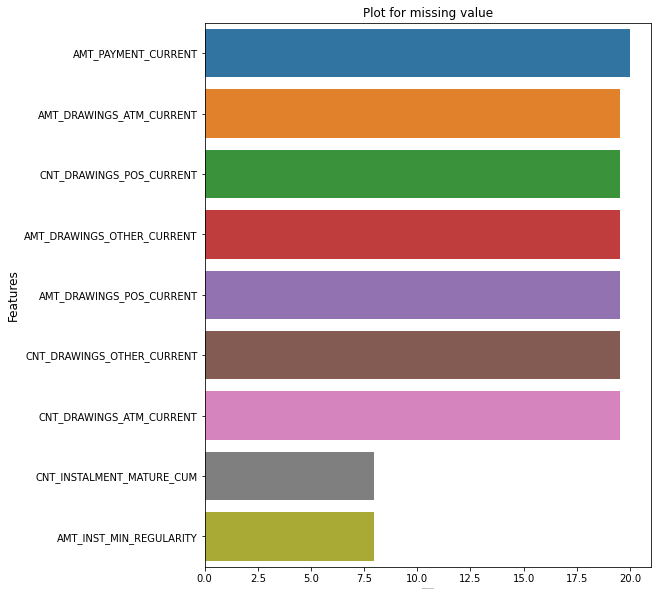

In [256]:
missing_value_info_plot(datasets['credit_card_balance'], 'credit_card_balance')

## Summary of installments_payments

In [257]:
datasets["installments_payments"].info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13605401 entries, 0 to 13605400
Data columns (total 8 columns):
 #   Column                  Non-Null Count     Dtype  
---  ------                  --------------     -----  
 0   SK_ID_PREV              13605401 non-null  int64  
 1   SK_ID_CURR              13605401 non-null  int64  
 2   NUM_INSTALMENT_VERSION  13605401 non-null  float64
 3   NUM_INSTALMENT_NUMBER   13605401 non-null  int64  
 4   DAYS_INSTALMENT         13605401 non-null  float64
 5   DAYS_ENTRY_PAYMENT      13602496 non-null  float64
 6   AMT_INSTALMENT          13605401 non-null  float64
 7   AMT_PAYMENT             13602496 non-null  float64
dtypes: float64(5), int64(3)
memory usage: 830.4 MB


In [258]:
datasets["installments_payments"].shape

(13605401, 8)

In [259]:
datasets["installments_payments"].head()

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585


In [260]:
datasets["installments_payments"].describe()

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
count,1.360540e+07,1.360540e+07,1.360540e+07,1.360540e+07,1.360540e+07,1.360250e+07,1.360540e+07,1.360250e+07
mean,1.903365e+06,2.784449e+05,8.566373e-01,1.887090e+01,-1.042270e+03,-1.051114e+03,1.705091e+04,1.723822e+04
std,5.362029e+05,1.027183e+05,1.035216e+00,2.666407e+01,8.009463e+02,8.005859e+02,5.057025e+04,5.473578e+04
min,1.000001e+06,1.000010e+05,0.000000e+00,1.000000e+00,-2.922000e+03,-4.921000e+03,0.000000e+00,0.000000e+00
25%,1.434191e+06,1.896390e+05,0.000000e+00,4.000000e+00,-1.654000e+03,-1.662000e+03,4.226085e+03,3.398265e+03
50%,1.896520e+06,2.786850e+05,1.000000e+00,8.000000e+00,-8.180000e+02,-8.270000e+02,8.884080e+03,8.125515e+03
75%,2.369094e+06,3.675300e+05,1.000000e+00,1.900000e+01,-3.610000e+02,-3.700000e+02,1.671021e+04,1.610842e+04
max,2.843499e+06,4.562550e+05,1.780000e+02,2.770000e+02,-1.000000e+00,-1.000000e+00,3.771488e+06,3.771488e+06


In [261]:
print("Different datatypes in installments_payments dataset")
datasets["installments_payments"].dtypes.value_counts()

Different datatypes in installments_payments dataset


float64    5
int64      3
dtype: int64

In [262]:
inst_columns= datasets["installments_payments"].columns
print(inst_columns)

Index(['SK_ID_PREV', 'SK_ID_CURR', 'NUM_INSTALMENT_VERSION',
       'NUM_INSTALMENT_NUMBER', 'DAYS_INSTALMENT', 'DAYS_ENTRY_PAYMENT',
       'AMT_INSTALMENT', 'AMT_PAYMENT'],
      dtype='object')


In [263]:
for key in datasets["installments_payments"].keys():
    n=len(pd.unique(datasets["installments_payments"][key]))
    print('Nunber of Unique values in ', format(key), 'is', format(n))

Nunber of Unique values in  SK_ID_PREV is 997752
Nunber of Unique values in  SK_ID_CURR is 339587
Nunber of Unique values in  NUM_INSTALMENT_VERSION is 65
Nunber of Unique values in  NUM_INSTALMENT_NUMBER is 277
Nunber of Unique values in  DAYS_INSTALMENT is 2922
Nunber of Unique values in  DAYS_ENTRY_PAYMENT is 3040
Nunber of Unique values in  AMT_INSTALMENT is 902539
Nunber of Unique values in  AMT_PAYMENT is 944236


In [264]:
s = datasets["installments_payments"].isnull().sum()

In [265]:
s[s!=0]

DAYS_ENTRY_PAYMENT    2905
AMT_PAYMENT           2905
dtype: int64

#### Missing data for installments_payments

,Percent,Train Missing Count
DAYS_ENTRY_PAYMENT,0.02,2905
AMT_PAYMENT,0.02,2905


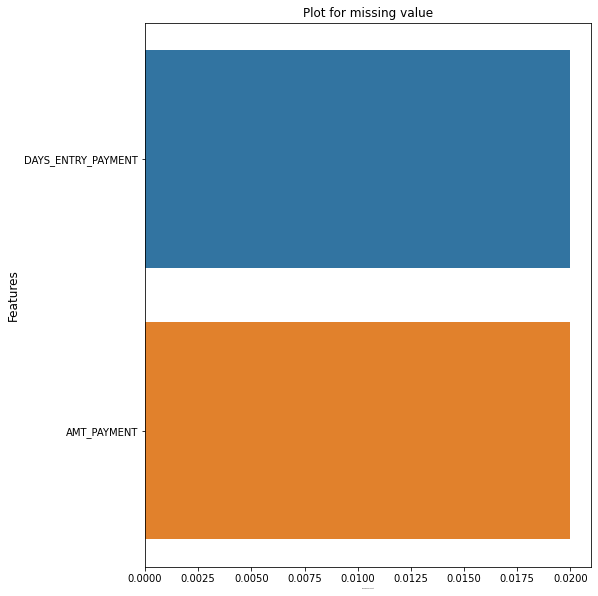

In [266]:
missing_value_info_plot(datasets['installments_payments'], 'installments_payments')

# Dataset questions
## Unique record for each SK_ID_CURR

In [267]:
datasets.keys()

dict_keys(['application_train', 'application_test', 'bureau', 'bureau_balance', 'credit_card_balance', 'installments_payments', 'previous_application', 'POS_CASH_balance'])

In [268]:
len(datasets["application_train"]["SK_ID_CURR"].unique()) == datasets["application_train"].shape[0]

True

In [269]:
np.intersect1d(datasets["application_train"]["SK_ID_CURR"], datasets["application_test"]["SK_ID_CURR"])

array([], dtype=int64)

In [270]:
datasets["application_test"].shape

(48744, 121)

In [271]:
datasets["application_train"].shape

(307511, 122)

## previous applications for the submission file
The persons in the kaggle submission file have had previous applications in the `previous_application.csv`. 47,800 out 48,744 people have had previous appications.

In [272]:
#appsDF.shape()

In [273]:
appsDF = datasets["previous_application"]

In [274]:
len(np.intersect1d(datasets["previous_application"]["SK_ID_CURR"], datasets["application_test"]["SK_ID_CURR"]))

47800

In [275]:
print(f"There are  {appsDF.shape[0]:,} previous applications")

There are  1,670,214 previous applications


In [276]:
# How many entries are there for each month?
prevAppCounts = appsDF['SK_ID_CURR'].value_counts(dropna=False)


In [277]:
len(prevAppCounts[prevAppCounts >40])  #more that 40 previous applications

101

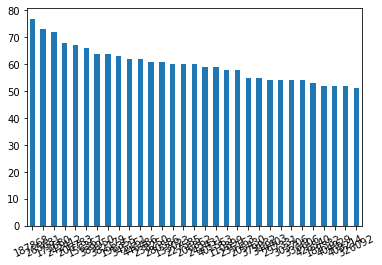

In [278]:
prevAppCounts[prevAppCounts >50].plot(kind='bar')
plt.xticks(rotation=25)
plt.show()

### Histogram of Number of previous applications for an ID

In [279]:
sum(appsDF['SK_ID_CURR'].value_counts()==1)

60458

Text(0.5, 1.0, 'Histogram of Number of previous applications for an ID')

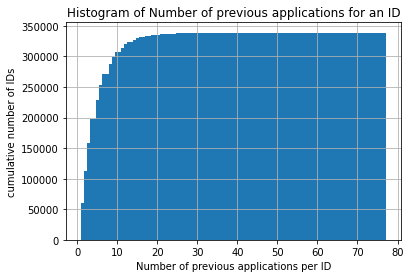

In [280]:
plt.hist(appsDF['SK_ID_CURR'].value_counts(), cumulative =True, bins = 100);
plt.grid()
plt.ylabel('cumulative number of IDs')
plt.xlabel('Number of previous applications per ID')
plt.title('Histogram of Number of previous applications for an ID')


##### **Can we differentiate applications by low, medium and high previous apps?**
    * Low = <5 claims (22%)
    * Medium = 10 to 39 claims (58%)
    * High = 40 or more claims (20%)

In [281]:
apps_all = appsDF['SK_ID_CURR'].nunique()
apps_5plus = appsDF['SK_ID_CURR'].value_counts()>=5
apps_40plus = appsDF['SK_ID_CURR'].value_counts()>=40
print('Percentage with 10 or more previous apps:', np.round(100.*(sum(apps_5plus)/apps_all),5))
print('Percentage with 40 or more previous apps:', np.round(100.*(sum(apps_40plus)/apps_all),5))

Percentage with 10 or more previous apps: 41.76895
Percentage with 40 or more previous apps: 0.03453


# Feature Engineering and Selection

In [15]:
appsDF = datasets["previous_application"]

In [17]:
class FeaturesAggregator(BaseEstimator, TransformerMixin):
    def __init__(self, file_name=None, features=None, funcs=None, primary_id = None): # no *args or **kargs
        self.file_name = file_name
        self.features = features
        self.funcs = funcs
        self.primary_id = primary_id
        self.agg_op_features = {}
        for f in self.features:
            temp = {f"{file_name}_{f}_{func}":func for func in self.funcs}
            self.agg_op_features[f]=[(k, v) for k, v in temp.items()]
        print(self.agg_op_features)
    
    def fit(self, X, y=None):
        return self
    
    def transform(self, X, y=None):
        #from IPython.core.debugger import Pdb as pdb;    pdb().set_trace() #breakpoint; dont forget to quit         
        result = X.groupby([self.primary_id]).agg(self.agg_op_features)
        result.columns = result.columns.droplevel()
        result = result.reset_index(level=[self.primary_id])
        return result # return dataframe with the join key "SK_ID_CURR"


In [18]:
agg_funcs = ['min','max']

#### Feature Engineering on bureau balance

In [19]:
datasets['bureau_balance'].shape

(27299925, 3)

In [20]:
bl_bureau = datasets['bureau_balance']

In [21]:
bl_bureau.shape

(27299925, 3)

In [22]:
bl_bureau.columns

Index(['SK_ID_BUREAU', 'MONTHS_BALANCE', 'STATUS'], dtype='object')

In [23]:
bl_bureau.isnull().sum()

SK_ID_BUREAU      0
MONTHS_BALANCE    0
STATUS            0
dtype: int64

In [24]:

bl_features = ['MONTHS_BALANCE']
bl_pipeline = Pipeline([
    ('bureau_balance', FeaturesAggregator('bureau_balance' ,bl_features , agg_funcs, "SK_ID_BUREAU")), 
    ])

{'MONTHS_BALANCE': [('bureau_balance_MONTHS_BALANCE_min', 'min'), ('bureau_balance_MONTHS_BALANCE_max', 'max')]}


In [25]:
bl_agg = bl_pipeline.fit_transform(bl_bureau)

In [26]:
bl_agg

,SK_ID_BUREAU,bureau_balance_MONTHS_BALANCE_min,bureau_balance_MONTHS_BALANCE_max
0,5001709,-96,0
1,5001710,-82,0
2,5001711,-3,0
3,5001712,-18,0
4,5001713,-21,0
...,...,...,...
817390,6842884,-47,0
817391,6842885,-23,0
817392,6842886,-32,0
817393,6842887,-36,0


#### feature engineering on pos_cash_balance

In [27]:
datasets['POS_CASH_balance'].shape

(10001358, 8)

In [28]:
pc_balance = datasets['POS_CASH_balance']

In [29]:
pc_balance.shape

(10001358, 8)

In [30]:
pc_balance.columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'MONTHS_BALANCE', 'CNT_INSTALMENT',
       'CNT_INSTALMENT_FUTURE', 'NAME_CONTRACT_STATUS', 'SK_DPD',
       'SK_DPD_DEF'],
      dtype='object')

In [31]:
pc_balance.isnull().sum()

SK_ID_PREV                   0
SK_ID_CURR                   0
MONTHS_BALANCE               0
CNT_INSTALMENT           26071
CNT_INSTALMENT_FUTURE    26087
NAME_CONTRACT_STATUS         0
SK_DPD                       0
SK_DPD_DEF                   0
dtype: int64

In [32]:
pcb_features = ['MONTHS_BALANCE','CNT_INSTALMENT','CNT_INSTALMENT_FUTURE']

In [33]:
pcb_pipeline = Pipeline([
    ('POS_CASH_balance', FeaturesAggregator('POS_CASH_balance' ,pcb_features , agg_funcs, "SK_ID_PREV")), 
    ])

{'MONTHS_BALANCE': [('POS_CASH_balance_MONTHS_BALANCE_min', 'min'), ('POS_CASH_balance_MONTHS_BALANCE_max', 'max')], 'CNT_INSTALMENT': [('POS_CASH_balance_CNT_INSTALMENT_min', 'min'), ('POS_CASH_balance_CNT_INSTALMENT_max', 'max')], 'CNT_INSTALMENT_FUTURE': [('POS_CASH_balance_CNT_INSTALMENT_FUTURE_min', 'min'), ('POS_CASH_balance_CNT_INSTALMENT_FUTURE_max', 'max')]}


In [34]:
pcg_agg = pcb_pipeline.fit_transform(pc_balance)

In [35]:
pcg_agg

,SK_ID_PREV,POS_CASH_balance_MONTHS_BALANCE_min,POS_CASH_balance_MONTHS_BALANCE_max,POS_CASH_balance_CNT_INSTALMENT_min,POS_CASH_balance_CNT_INSTALMENT_max,POS_CASH_balance_CNT_INSTALMENT_FUTURE_min,POS_CASH_balance_CNT_INSTALMENT_FUTURE_max
0,1000001,-10,-8,2.0,12.0,0.0,12.0
1,1000002,-54,-50,4.0,6.0,0.0,4.0
2,1000003,-4,-1,12.0,12.0,9.0,12.0
3,1000004,-29,-22,7.0,10.0,0.0,10.0
4,1000005,-56,-46,10.0,10.0,0.0,10.0
...,...,...,...,...,...,...,...
936320,2843494,-26,-24,2.0,48.0,0.0,48.0
936321,2843495,-16,-9,7.0,60.0,0.0,60.0
936322,2843497,-21,-1,24.0,24.0,4.0,24.0
936323,2843498,-48,-42,6.0,36.0,0.0,36.0


#### feature engineering on credit card balance

In [36]:
datasets['credit_card_balance'].shape

(3840312, 23)

In [37]:
cc_balance = datasets['credit_card_balance']

In [38]:
cc_balance.shape

(3840312, 23)

In [39]:
cc_balance.columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'MONTHS_BALANCE', 'AMT_BALANCE',
       'AMT_CREDIT_LIMIT_ACTUAL', 'AMT_DRAWINGS_ATM_CURRENT',
       'AMT_DRAWINGS_CURRENT', 'AMT_DRAWINGS_OTHER_CURRENT',
       'AMT_DRAWINGS_POS_CURRENT', 'AMT_INST_MIN_REGULARITY',
       'AMT_PAYMENT_CURRENT', 'AMT_PAYMENT_TOTAL_CURRENT',
       'AMT_RECEIVABLE_PRINCIPAL', 'AMT_RECIVABLE', 'AMT_TOTAL_RECEIVABLE',
       'CNT_DRAWINGS_ATM_CURRENT', 'CNT_DRAWINGS_CURRENT',
       'CNT_DRAWINGS_OTHER_CURRENT', 'CNT_DRAWINGS_POS_CURRENT',
       'CNT_INSTALMENT_MATURE_CUM', 'NAME_CONTRACT_STATUS', 'SK_DPD',
       'SK_DPD_DEF'],
      dtype='object')

In [40]:
cc_balance.isnull().sum()

SK_ID_PREV                         0
SK_ID_CURR                         0
MONTHS_BALANCE                     0
AMT_BALANCE                        0
AMT_CREDIT_LIMIT_ACTUAL            0
AMT_DRAWINGS_ATM_CURRENT      749816
AMT_DRAWINGS_CURRENT               0
AMT_DRAWINGS_OTHER_CURRENT    749816
AMT_DRAWINGS_POS_CURRENT      749816
AMT_INST_MIN_REGULARITY       305236
AMT_PAYMENT_CURRENT           767988
AMT_PAYMENT_TOTAL_CURRENT          0
AMT_RECEIVABLE_PRINCIPAL           0
AMT_RECIVABLE                      0
AMT_TOTAL_RECEIVABLE               0
CNT_DRAWINGS_ATM_CURRENT      749816
CNT_DRAWINGS_CURRENT               0
CNT_DRAWINGS_OTHER_CURRENT    749816
CNT_DRAWINGS_POS_CURRENT      749816
CNT_INSTALMENT_MATURE_CUM     305236
NAME_CONTRACT_STATUS               0
SK_DPD                             0
SK_DPD_DEF                         0
dtype: int64

In [41]:
cc_balance['difference_payment'] = (cc_balance['AMT_PAYMENT_TOTAL_CURRENT'] - cc_balance['AMT_PAYMENT_CURRENT']).replace(np.inf, 0)

In [42]:
cc_balance['AMT_DRAWINGS_ratio'] = (cc_balance['AMT_DRAWINGS_CURRENT']/cc_balance['AMT_CREDIT_LIMIT_ACTUAL']).replace(np.inf, 0)

In [43]:
ccb_features = ['AMT_BALANCE','AMT_DRAWINGS_CURRENT','difference_payment','AMT_DRAWINGS_ratio']

In [44]:
ccb_pipeline = Pipeline([
    ('credit_card_balance', FeaturesAggregator('credit_card_balance' ,ccb_features , agg_funcs, "SK_ID_PREV")), 
    ])

{'AMT_BALANCE': [('credit_card_balance_AMT_BALANCE_min', 'min'), ('credit_card_balance_AMT_BALANCE_max', 'max')], 'AMT_DRAWINGS_CURRENT': [('credit_card_balance_AMT_DRAWINGS_CURRENT_min', 'min'), ('credit_card_balance_AMT_DRAWINGS_CURRENT_max', 'max')], 'difference_payment': [('credit_card_balance_difference_payment_min', 'min'), ('credit_card_balance_difference_payment_max', 'max')], 'AMT_DRAWINGS_ratio': [('credit_card_balance_AMT_DRAWINGS_ratio_min', 'min'), ('credit_card_balance_AMT_DRAWINGS_ratio_max', 'max')]}


In [45]:
ccb_agg = ccb_pipeline.fit_transform(cc_balance)

In [46]:
ccb_agg

,SK_ID_PREV,credit_card_balance_AMT_BALANCE_min,credit_card_balance_AMT_BALANCE_max,credit_card_balance_AMT_DRAWINGS_CURRENT_min,credit_card_balance_AMT_DRAWINGS_CURRENT_max,credit_card_balance_difference_payment_min,credit_card_balance_difference_payment_max,credit_card_balance_AMT_DRAWINGS_ratio_min,credit_card_balance_AMT_DRAWINGS_ratio_max
0,1000018,38879.145,136695.420,2032.56,69156.945,0.000,0.0,0.045168,1.134281
1,1000030,0.000,103027.275,0.00,46660.500,-5431.050,0.0,0.000000,0.691239
2,1000031,0.000,154945.935,0.00,155340.000,0.000,0.0,0.000000,0.690400
3,1000035,0.000,0.000,0.00,0.000,NaN,NaN,0.000000,0.000000
4,1000077,0.000,0.000,0.00,0.000,NaN,NaN,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...
104302,2843476,0.000,173458.800,0.00,90000.000,-299.925,0.0,0.000000,0.500000
104303,2843477,0.000,63850.950,0.00,58500.000,-388.350,0.0,0.000000,0.866667
104304,2843478,0.000,77646.555,0.00,67500.000,-178.515,0.0,0.000000,0.750000
104305,2843493,0.000,78839.595,0.00,47839.500,-4358.970,0.0,0.000000,0.354367


#### feature engineering on installment payments


In [47]:
datasets['installments_payments'].shape

(13605401, 8)

In [48]:
i_payments = datasets['installments_payments']

In [49]:
i_payments.shape

(13605401, 8)

In [50]:
i_payments.isnull().sum()

SK_ID_PREV                   0
SK_ID_CURR                   0
NUM_INSTALMENT_VERSION       0
NUM_INSTALMENT_NUMBER        0
DAYS_INSTALMENT              0
DAYS_ENTRY_PAYMENT        2905
AMT_INSTALMENT               0
AMT_PAYMENT               2905
dtype: int64

In [51]:
i_payments.columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'NUM_INSTALMENT_VERSION',
       'NUM_INSTALMENT_NUMBER', 'DAYS_INSTALMENT', 'DAYS_ENTRY_PAYMENT',
       'AMT_INSTALMENT', 'AMT_PAYMENT'],
      dtype='object')

In [52]:
i_payments['DAYS_INSTALMENT_diff'] = (i_payments['DAYS_INSTALMENT'] - i_payments['DAYS_ENTRY_PAYMENT']).replace(np.inf, 0)

In [53]:
ip_features = ['DAYS_INSTALMENT','AMT_INSTALMENT','DAYS_INSTALMENT_diff']

In [54]:
ip_pipeline = Pipeline([
    ('installments_payments', FeaturesAggregator('installments_payments' ,ip_features , agg_funcs, "SK_ID_PREV")), 
    ])

{'DAYS_INSTALMENT': [('installments_payments_DAYS_INSTALMENT_min', 'min'), ('installments_payments_DAYS_INSTALMENT_max', 'max')], 'AMT_INSTALMENT': [('installments_payments_AMT_INSTALMENT_min', 'min'), ('installments_payments_AMT_INSTALMENT_max', 'max')], 'DAYS_INSTALMENT_diff': [('installments_payments_DAYS_INSTALMENT_diff_min', 'min'), ('installments_payments_DAYS_INSTALMENT_diff_max', 'max')]}


In [55]:
ip_agg = ip_pipeline.fit_transform(i_payments)

In [56]:
ip_agg

,SK_ID_PREV,installments_payments_DAYS_INSTALMENT_min,installments_payments_DAYS_INSTALMENT_max,installments_payments_AMT_INSTALMENT_min,installments_payments_AMT_INSTALMENT_max,installments_payments_DAYS_INSTALMENT_diff_min,installments_payments_DAYS_INSTALMENT_diff_max
0,1000001,-268.0,-238.0,6404.310,62039.115,6.0,26.0
1,1000002,-1600.0,-1510.0,6264.000,18443.565,5.0,44.0
2,1000003,-94.0,-34.0,4951.350,4951.350,14.0,17.0
3,1000004,-862.0,-682.0,3391.110,13176.495,10.0,58.0
4,1000005,-1688.0,-1418.0,14599.260,14713.605,-3.0,36.0
...,...,...,...,...,...,...,...
997747,2843495,-439.0,-259.0,23556.195,656193.015,-1.0,14.0
997748,2843496,-438.0,-16.0,3.555,83553.840,0.0,19.0
997749,2843497,-588.0,-18.0,9175.185,9175.185,0.0,19.0
997750,2843498,-1442.0,-1296.0,16191.990,333361.485,0.0,22.0


#### merging tertiary datasets with secondary datasets

In [57]:
prev_app = datasets['previous_application']

In [58]:
prev_app.shape

(1670214, 37)

In [59]:
prev_app.isnull().sum()

SK_ID_PREV                           0
SK_ID_CURR                           0
NAME_CONTRACT_TYPE                   0
AMT_ANNUITY                     372235
AMT_APPLICATION                      0
AMT_CREDIT                           1
AMT_DOWN_PAYMENT                895844
AMT_GOODS_PRICE                 385515
WEEKDAY_APPR_PROCESS_START           0
HOUR_APPR_PROCESS_START              0
FLAG_LAST_APPL_PER_CONTRACT          0
NFLAG_LAST_APPL_IN_DAY               0
RATE_DOWN_PAYMENT               895844
RATE_INTEREST_PRIMARY          1664263
RATE_INTEREST_PRIVILEGED       1664263
NAME_CASH_LOAN_PURPOSE               0
NAME_CONTRACT_STATUS                 0
DAYS_DECISION                        0
NAME_PAYMENT_TYPE                    0
CODE_REJECT_REASON                   0
NAME_TYPE_SUITE                 820405
NAME_CLIENT_TYPE                     0
NAME_GOODS_CATEGORY                  0
NAME_PORTFOLIO                       0
NAME_PRODUCT_TYPE                    0
CHANNEL_TYPE             

In [61]:
prev_app.shape

(1670214, 37)

In [62]:
prev_app['AMT_ANNUITY_ratio'] = (prev_app['AMT_ANNUITY']/prev_app['AMT_CREDIT']).replace(np.inf, 0)

In [69]:
prev_app = prev_app.merge(pcg_agg, how='left', on="SK_ID_PREV")


In [70]:
prev_app = prev_app.merge(ip_agg, how='left', on="SK_ID_PREV")


In [71]:
prev_app = prev_app.merge(ccb_agg, how='left', on="SK_ID_PREV")

In [72]:
prev_app.shape

(1670214, 58)

In [73]:
pa_features = ['AMT_APPLICATION','AMT_CREDIT','AMT_ANNUITY','AMT_ANNUITY_ratio']

In [74]:
pa_features = pa_features + pcg_agg.columns[1:].tolist() + ccb_agg.columns[1:].tolist() + ip_agg.columns[1:].tolist()

In [75]:
print(len(pa_features))

24


In [76]:
agg_funcs1 = ['count','max','min','sum']

In [77]:
pa_pipeline = Pipeline([
    ('previous_application', FeaturesAggregator('previous_application' ,pa_features , agg_funcs1, "SK_ID_CURR")), 
    ])

{'AMT_APPLICATION': [('previous_application_AMT_APPLICATION_count', 'count'), ('previous_application_AMT_APPLICATION_max', 'max'), ('previous_application_AMT_APPLICATION_min', 'min'), ('previous_application_AMT_APPLICATION_sum', 'sum')], 'AMT_CREDIT': [('previous_application_AMT_CREDIT_count', 'count'), ('previous_application_AMT_CREDIT_max', 'max'), ('previous_application_AMT_CREDIT_min', 'min'), ('previous_application_AMT_CREDIT_sum', 'sum')], 'AMT_ANNUITY': [('previous_application_AMT_ANNUITY_count', 'count'), ('previous_application_AMT_ANNUITY_max', 'max'), ('previous_application_AMT_ANNUITY_min', 'min'), ('previous_application_AMT_ANNUITY_sum', 'sum')], 'AMT_ANNUITY_ratio': [('previous_application_AMT_ANNUITY_ratio_count', 'count'), ('previous_application_AMT_ANNUITY_ratio_max', 'max'), ('previous_application_AMT_ANNUITY_ratio_min', 'min'), ('previous_application_AMT_ANNUITY_ratio_sum', 'sum')], 'POS_CASH_balance_MONTHS_BALANCE_min': [('previous_application_POS_CASH_balance_MONTHS

In [78]:
pa_agg = pa_pipeline.fit_transform(prev_app)

In [79]:
pa_agg

,SK_ID_CURR,previous_application_AMT_APPLICATION_count,previous_application_AMT_APPLICATION_max,previous_application_AMT_APPLICATION_min,previous_application_AMT_APPLICATION_sum,previous_application_AMT_CREDIT_count,previous_application_AMT_CREDIT_max,previous_application_AMT_CREDIT_min,previous_application_AMT_CREDIT_sum,previous_application_AMT_ANNUITY_count,...,previous_application_installments_payments_AMT_INSTALMENT_max_min,previous_application_installments_payments_AMT_INSTALMENT_max_sum,previous_application_installments_payments_DAYS_INSTALMENT_diff_min_count,previous_application_installments_payments_DAYS_INSTALMENT_diff_min_max,previous_application_installments_payments_DAYS_INSTALMENT_diff_min_min,previous_application_installments_payments_DAYS_INSTALMENT_diff_min_sum,previous_application_installments_payments_DAYS_INSTALMENT_diff_max_count,previous_application_installments_payments_DAYS_INSTALMENT_diff_max_max,previous_application_installments_payments_DAYS_INSTALMENT_diff_max_min,previous_application_installments_payments_DAYS_INSTALMENT_diff_max_sum
0,100001,1,24835.5,24835.5,24835.5,1,23787.0,23787.0,23787.0,1,...,17397.900,17397.900,1,6.0,6.0,6.0,1,36.0,36.0,36.0
1,100002,1,179055.0,179055.0,179055.0,1,179055.0,179055.0,179055.0,1,...,53093.745,53093.745,1,12.0,12.0,12.0,1,31.0,31.0,31.0
2,100003,3,900000.0,68809.5,1306309.5,3,1035882.0,68053.5,1452573.0,3,...,6737.310,632140.335,3,9.0,1.0,13.0,3,14.0,8.0,36.0
3,100004,1,24282.0,24282.0,24282.0,1,20106.0,20106.0,20106.0,1,...,10573.965,10573.965,1,3.0,3.0,3.0,1,11.0,11.0,11.0
4,100005,2,44617.5,0.0,44617.5,2,40153.5,0.0,40153.5,1,...,17656.245,17656.245,1,-1.0,-1.0,-1.0,1,37.0,37.0,37.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
338852,456251,1,40455.0,40455.0,40455.0,1,40455.0,40455.0,40455.0,1,...,12815.010,12815.010,1,8.0,8.0,8.0,1,46.0,46.0,46.0
338853,456252,1,57595.5,57595.5,57595.5,1,56821.5,56821.5,56821.5,1,...,10074.465,10074.465,1,-3.0,-3.0,-3.0,1,11.0,11.0,11.0
338854,456253,2,28912.5,19413.0,48325.5,2,27306.0,13945.5,41251.5,2,...,3973.095,9548.280,2,16.0,-9.0,7.0,2,51.0,27.0,78.0
338855,456254,2,223789.5,18846.0,242635.5,2,247423.5,21456.0,268879.5,2,...,2296.440,21362.265,2,16.0,8.0,24.0,2,31.0,15.0,46.0


### Domain based features

In [80]:
pa_agg['previous_application_AMT_APPLICATION_avg'] = (
   pa_agg['previous_application_AMT_APPLICATION_sum'] / pa_agg['previous_application_AMT_APPLICATION_count'] ).replace(np.inf, 0) 

pa_agg['previous_application_AMT_APPLICATION_range'] = (
   pa_agg['previous_application_AMT_APPLICATION_max'] - pa_agg['previous_application_AMT_APPLICATION_min'] ).replace(np.inf, 0) 

In [81]:
pa_agg.shape

(338857, 99)

##### merging bureau balance with bureau

In [82]:
datasets['bureau'].shape

(1716428, 17)

In [83]:
bureau = datasets['bureau']

In [84]:
bureau.isnull().sum()

SK_ID_CURR                      0
SK_ID_BUREAU                    0
CREDIT_ACTIVE                   0
CREDIT_CURRENCY                 0
DAYS_CREDIT                     0
CREDIT_DAY_OVERDUE              0
DAYS_CREDIT_ENDDATE        105553
DAYS_ENDDATE_FACT          633653
AMT_CREDIT_MAX_OVERDUE    1124488
CNT_CREDIT_PROLONG              0
AMT_CREDIT_SUM                 13
AMT_CREDIT_SUM_DEBT        257669
AMT_CREDIT_SUM_LIMIT       591780
AMT_CREDIT_SUM_OVERDUE          0
CREDIT_TYPE                     0
DAYS_CREDIT_UPDATE              0
AMT_ANNUITY               1226791
dtype: int64

In [85]:
# df_missing = pd.DataFrame(np.round((bureau.isna().sum()/ bureau.shape[0]) * 100, 2), columns=['Percent'], index= bureau.columns)
# df_missing_50_cols = df_missing[df_missing.Percent >= 50].index

# # Drop 
# bureau.drop(columns=df_missing_50_cols, inplace=True)

In [86]:
bureau.shape 

(1716428, 17)

In [87]:
bureau = bureau.merge(bl_agg, on = "SK_ID_BUREAU", how = 'left')

In [88]:
bureau.shape

(1716428, 19)

In [89]:
bureau_features = ['AMT_CREDIT_SUM']

In [90]:
bureau_features = bureau_features + bl_agg.columns[1:].tolist()

In [91]:
len(bureau_features)

3

In [92]:
bureau_pipeline = Pipeline([
    ('bureau', FeaturesAggregator('bureau' ,bureau_features , agg_funcs1, "SK_ID_CURR")), 
    ])

{'AMT_CREDIT_SUM': [('bureau_AMT_CREDIT_SUM_count', 'count'), ('bureau_AMT_CREDIT_SUM_max', 'max'), ('bureau_AMT_CREDIT_SUM_min', 'min'), ('bureau_AMT_CREDIT_SUM_sum', 'sum')], 'bureau_balance_MONTHS_BALANCE_min': [('bureau_bureau_balance_MONTHS_BALANCE_min_count', 'count'), ('bureau_bureau_balance_MONTHS_BALANCE_min_max', 'max'), ('bureau_bureau_balance_MONTHS_BALANCE_min_min', 'min'), ('bureau_bureau_balance_MONTHS_BALANCE_min_sum', 'sum')], 'bureau_balance_MONTHS_BALANCE_max': [('bureau_bureau_balance_MONTHS_BALANCE_max_count', 'count'), ('bureau_bureau_balance_MONTHS_BALANCE_max_max', 'max'), ('bureau_bureau_balance_MONTHS_BALANCE_max_min', 'min'), ('bureau_bureau_balance_MONTHS_BALANCE_max_sum', 'sum')]}


In [93]:
bureau_agg = bureau_pipeline.fit_transform(bureau)


In [94]:
bureau_agg

,SK_ID_CURR,bureau_AMT_CREDIT_SUM_count,bureau_AMT_CREDIT_SUM_max,bureau_AMT_CREDIT_SUM_min,bureau_AMT_CREDIT_SUM_sum,bureau_bureau_balance_MONTHS_BALANCE_min_count,bureau_bureau_balance_MONTHS_BALANCE_min_max,bureau_bureau_balance_MONTHS_BALANCE_min_min,bureau_bureau_balance_MONTHS_BALANCE_min_sum,bureau_bureau_balance_MONTHS_BALANCE_max_count,bureau_bureau_balance_MONTHS_BALANCE_max_max,bureau_bureau_balance_MONTHS_BALANCE_max_min,bureau_bureau_balance_MONTHS_BALANCE_max_sum
0,100001,7,378000.00,85500.0,1453365.000,7,-1.0,-51.0,-165.0,7,0.0,0.0,0.0
1,100002,8,450000.00,0.0,865055.565,8,-3.0,-47.0,-226.0,8,0.0,-32.0,-124.0
2,100003,4,810000.00,22248.0,1017400.500,0,NaN,NaN,0.0,0,NaN,NaN,0.0
3,100004,2,94537.80,94500.0,189037.800,0,NaN,NaN,0.0,0,NaN,NaN,0.0
4,100005,3,568800.00,29826.0,657126.000,3,-2.0,-12.0,-18.0,3,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
305806,456249,13,765000.00,43447.5,3693858.660,0,NaN,NaN,0.0,0,NaN,NaN,0.0
305807,456250,3,2153110.05,450000.0,3086459.550,3,-25.0,-32.0,-84.0,3,0.0,0.0,0.0
305808,456253,4,2250000.00,360000.0,3960000.000,4,-23.0,-30.0,-113.0,4,0.0,0.0,0.0
305809,456254,1,45000.00,45000.0,45000.000,1,-36.0,-36.0,-36.0,1,0.0,0.0,0.0


### Domain knowledge based features

In [95]:
bureau_agg['bureau_AMT_CREDIT_SUM_avg'] = (
   bureau_agg['bureau_AMT_CREDIT_SUM_sum'] / bureau_agg['bureau_AMT_CREDIT_SUM_count'] ).replace(np.inf, 0) 

bureau_agg['bureau_AMT_APPLICATION_range'] = (
   bureau_agg['bureau_AMT_CREDIT_SUM_max'] - bureau_agg['bureau_AMT_CREDIT_SUM_min'] ).replace(np.inf, 0)

In [96]:
bureau_agg.shape

(305811, 15)

## Merging secondary with primary datasets

In [97]:
datasets['application_train'].shape

(307511, 122)

In [98]:
app_train = datasets['application_train']

In [99]:
df_missing = pd.DataFrame(np.round((app_train.isna().sum()/ app_train.shape[0]) * 100, 2), columns=['Percent'], index= app_train.columns)
df_missing_50_cols = df_missing[df_missing.Percent >= 50].index

# Drop 
app_train.drop(columns=df_missing_50_cols, inplace=True)

In [100]:
app_train.shape


(307511, 81)

In [101]:
pa_agg.shape

(338857, 99)

In [103]:
pa_agg.shape

(338857, 99)

In [104]:
bureau_agg.shape

(305811, 15)

In [106]:
bureau_agg.shape

(305811, 15)

In [107]:
app_train = app_train.merge(pa_agg, on = "SK_ID_CURR", how = 'left')

In [108]:
app_train = app_train.merge(bureau_agg, on = "SK_ID_CURR", how = 'left')

In [109]:
app_train.shape

(307511, 193)

In [111]:
app_train.shape

(307511, 193)

In [112]:
app_train['CREDIT_INCOME_PCT'] = app_train['AMT_CREDIT'] / app_train['AMT_INCOME_TOTAL']
app_train['CREDIT_TERM'] = app_train['AMT_ANNUITY'] / app_train['AMT_CREDIT']

## filling missing values with 0

In [113]:
app_train[pa_agg.columns] = app_train[pa_agg.columns].fillna(0)

In [114]:
app_train[bureau_agg.columns] = app_train[bureau_agg.columns].fillna(0)

In [115]:
app_train.shape

(307511, 195)

In [116]:
num_features = []

for col in app_train.columns:
    if app_train[col].dtype == 'int64' or app_train[col].dtype == 'float64':
        num_features.append(col)
len(num_features)

182

In [117]:
cat_cols2 = []

for col in app_train.columns:
    if app_train[col].dtype == 'object':
        cat_cols2.append(col)
len(cat_cols2)

13

In [118]:
total_features = num_features+cat_cols2

In [119]:
app_train.isnull().sum()

SK_ID_CURR                                       0
TARGET                                           0
NAME_CONTRACT_TYPE                               0
CODE_GENDER                                      0
FLAG_OWN_CAR                                     0
                                                ..
bureau_bureau_balance_MONTHS_BALANCE_max_sum     0
bureau_AMT_CREDIT_SUM_avg                        0
bureau_AMT_APPLICATION_range                     0
CREDIT_INCOME_PCT                                0
CREDIT_TERM                                     12
Length: 195, dtype: int64

### Finding correlations for feature selection

In [120]:
corr_with_target = app_train.corr()['TARGET'].abs().sort_values()

In [121]:
corr_with_target

FLAG_DOCUMENT_20                                                           0.000215
FLAG_DOCUMENT_5                                                            0.000316
FLAG_CONT_MOBILE                                                           0.000370
FLAG_MOBIL                                                                 0.000534
previous_application_installments_payments_DAYS_INSTALMENT_diff_max_max    0.000604
                                                                             ...   
REGION_RATING_CLIENT_W_CITY                                                0.060893
DAYS_BIRTH                                                                 0.078239
EXT_SOURCE_2                                                               0.160472
EXT_SOURCE_3                                                               0.178919
TARGET                                                                     1.000000
Name: TARGET, Length: 182, dtype: float64

In [122]:
corr_with_target.tail(6)

REGION_RATING_CLIENT           0.058899
REGION_RATING_CLIENT_W_CITY    0.060893
DAYS_BIRTH                     0.078239
EXT_SOURCE_2                   0.160472
EXT_SOURCE_3                   0.178919
TARGET                         1.000000
Name: TARGET, dtype: float64

In [123]:
print("Top 40 correlated features are:")
high_corr = corr_with_target.tail(31)


Top 40 correlated features are:


In [124]:
high_corr_list = high_corr.index.tolist()

In [125]:
high_corr_list

['previous_application_POS_CASH_balance_MONTHS_BALANCE_max_sum',
 'AMT_GOODS_PRICE',
 'previous_application_POS_CASH_balance_MONTHS_BALANCE_min_min',
 'previous_application_installments_payments_DAYS_INSTALMENT_min_min',
 'previous_application_credit_card_balance_AMT_BALANCE_max_min',
 'previous_application_credit_card_balance_AMT_BALANCE_max_sum',
 'previous_application_credit_card_balance_AMT_BALANCE_max_max',
 'DAYS_REGISTRATION',
 'previous_application_installments_payments_DAYS_INSTALMENT_max_min',
 'previous_application_POS_CASH_balance_MONTHS_BALANCE_max_min',
 'FLOORSMAX_MODE',
 'FLOORSMAX_MEDI',
 'previous_application_credit_card_balance_difference_payment_min_count',
 'previous_application_credit_card_balance_difference_payment_max_count',
 'FLOORSMAX_AVG',
 'FLAG_DOCUMENT_3',
 'REG_CITY_NOT_LIVE_CITY',
 'previous_application_credit_card_balance_AMT_DRAWINGS_ratio_max_min',
 'previous_application_credit_card_balance_AMT_DRAWINGS_ratio_max_max',
 'previous_application_credit_c

## Modeling pipelines

In [126]:
app_train_df = app_train

In [127]:
class DataFrameSelector(BaseEstimator, TransformerMixin):
    def __init__(self, attribute_names):
        self.attribute_names = attribute_names
    def fit(self, X, y=None):
        return self
    def transform(self, X):
        return X[self.attribute_names].values


In [128]:
num_attribs=app_train_df.select_dtypes(include=['int64', 'float64']).columns.tolist()

In [129]:
num_attribs.remove('TARGET')

In [130]:
cat_attribs = app_train_df.select_dtypes(exclude=['float64','int64']).columns.tolist()

In [131]:

from sklearn.preprocessing import OrdinalEncoder

# Identify the numeric features we wish to consider. 
num_attribs = num_attribs

num_pipeline = Pipeline([
        ('selector', DataFrameSelector(num_attribs)),
        ('imputer', SimpleImputer(strategy='mean')),
        ('std_scaler', StandardScaler()),
    ])
# Identify the categorical features we wish to consider.
cat_attribs = cat_attribs

cat_pipeline = Pipeline([
        ('selector', DataFrameSelector(cat_attribs)),
        ('imputer', SimpleImputer(strategy='most_frequent')),
        #('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
        ('ohe', OneHotEncoder(sparse=False, handle_unknown="ignore"))
    ])

data_prep_pipeline = FeatureUnion(transformer_list=[
        ("num_pipeline", num_pipeline),
        ("cat_pipeline", cat_pipeline),
    ])
              



In [132]:
selected_features = num_attribs+cat_attribs

In [133]:
#from sklearn.ensemble import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC

In [134]:
def pct(x):
    return round(100*x,3)

In [174]:
try:
    expLog
except NameError:
    expLog = pd.DataFrame(columns=["exp_name", 
                                   "Train Acc", 
                                  
                                   "Test  Acc",
                                   "Train AUC", 
                                   
                                   "Test  AUC",
                                   "Train F1",
                                   "Test F1"
                                  ])


In [175]:
#del expLog# total_features.remove('TARGET')

In [176]:
expLog

,exp_name,Train Acc,Test Acc,Train AUC,Test AUC,Train F1,Test F1


In [138]:

splits = 50



finaldf = np.array_split(app_train_df, splits)
X_train = finaldf[0][selected_features]
y_train = finaldf[0]['TARGET']
# X_kaggle_test= X_kaggle_test[selected_features]

## split part of data
X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, stratify=y_train,
                                                    test_size=0.3, random_state=42)

# X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train,stratify=y_train,test_size=0.15, random_state=42)

# print(f"X train           shape: {X_train.shape}")
# print(f"X validation      shape: {X_valid.shape}")
# print(f"X test            shape: {X_test.shape}")
# print(f"X kaggle_test     shape: {X_kaggle_test.shape}")


In [139]:
X_train.shape

(4305, 194)

In [140]:
X_test.shape

(1846, 194)

In [141]:
y_train.shape

(4305,)

### Logistic Regression

In [142]:
%%time 
np.random.seed(42)
full_pipeline_with_predictor = Pipeline([
        ("preparation", data_prep_pipeline),
        ("linear", LogisticRegression())
    ])

CPU times: user 297 µs, sys: 0 ns, total: 297 µs
Wall time: 304 µs


In [143]:
from sklearn.model_selection import ShuffleSplit
cvSplits = ShuffleSplit(n_splits=5, test_size=0.3, random_state=42)

In [146]:
import time

start = time.time()
model_lr = full_pipeline_with_predictor.fit(X_train, y_train)
np.random.seed(42)


logit_scores = cross_val_score(full_pipeline_with_predictor,X_train , y_train,cv=cvSplits)               
logit_score_train = pct(logit_scores.mean())
train_time = np.round(time.time() - start, 4)


start = time.time()
logit_score_test  = full_pipeline_with_predictor.score(X_test, y_test)
test_time = np.round(time.time() - start, 4)

In [147]:
# model_lr = full_pipeline_with_predictor.fit(X_train,y_train)

In [148]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import accuracy_score, confusion_matrix, f1_score, log_loss, classification_report, roc_auc_score, make_scorer


np.round(accuracy_score(y_train, model_lr.predict(X_train)), 3)

0.924

In [151]:
from sklearn.metrics import roc_auc_score
roc_auc_score(y_train, model_lr.predict_proba(X_train)[:, 1])


0.846483702394827

In [177]:
exp_name = "Logistic Regression"
expLog.loc[len(expLog)] = [f"{exp_name}"] + list(np.round(
               [accuracy_score(y_train, model_lr.predict(X_train)), 
                accuracy_score(y_test, model_lr.predict(X_test)),
                roc_auc_score(y_train, model_lr.predict_proba(X_train)[:, 1]),
                roc_auc_score(y_test, model_lr.predict_proba(X_test)[:, 1]),
                f1_score(y_train, model_lr.predict(X_train), average='weighted'),
                f1_score(y_test, model_lr.predict(X_test), average='weighted')],
    4)) 
expLog

,exp_name,Train Acc,Test Acc,Train AUC,Test AUC,Train F1,Test F1
0,Logistic Regression,0.924,0.9112,0.8465,0.6855,0.8972,0.8827


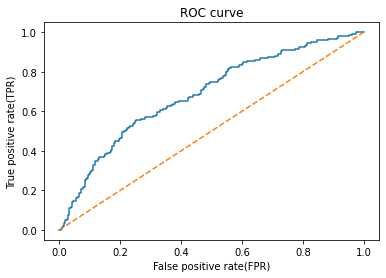

In [157]:
from sklearn import metrics
fpr,tpr,thresh = metrics.roc_curve(y_test,model_lr.predict_proba(X_test)[:,1])
plt.plot(fpr,tpr)
plt.plot(np.arange(0,1.1,0.1),np.arange(0,1.1,0.1),linestyle="dashed")
plt.xlabel("False positive rate(FPR)")
plt.ylabel("True positive rate(TPR)")
plt.title("ROC curve")
plt.show()

<Figure size 432x288 with 0 Axes>

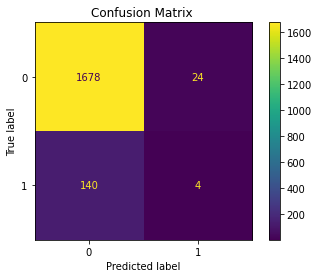

In [159]:
from sklearn.metrics import plot_confusion_matrix
plt.clf()
plot_confusion_matrix(model_lr,X_test,y_test)
plt.title('Confusion Matrix ')
plt.show()

### Random Forest with hyper parameter tuning

In [160]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV


n_estimators = [100,200]
max_depth = [10,20]
max_features=[2,3]



random_grid = {'rf__n_estimators': n_estimators,
               'rf__max_depth': max_depth,
               'rf__max_features':max_features}

print(random_grid)


{'rf__n_estimators': [100, 200], 'rf__max_depth': [10, 20], 'rf__max_features': [2, 3]}


In [161]:
%%time 
np.random.seed(42)
full_pipeline_with_predictor_1 = Pipeline([
        ("preparation", data_prep_pipeline),
        ('rf', RandomForestClassifier())
    ])
rf_random = GridSearchCV(full_pipeline_with_predictor_1, param_grid = random_grid, cv = 5, verbose=2,scoring='accuracy')

CPU times: user 324 µs, sys: 48 µs, total: 372 µs
Wall time: 383 µs


In [162]:
rf_random.fit(X_train,y_train)

Fitting 5 folds for each of 8 candidates, totalling 40 fits
[CV] END rf__max_depth=10, rf__max_features=2, rf__n_estimators=100; total time=   0.5s
[CV] END rf__max_depth=10, rf__max_features=2, rf__n_estimators=100; total time=   0.5s
[CV] END rf__max_depth=10, rf__max_features=2, rf__n_estimators=100; total time=   0.5s
[CV] END rf__max_depth=10, rf__max_features=2, rf__n_estimators=100; total time=   0.4s
[CV] END rf__max_depth=10, rf__max_features=2, rf__n_estimators=100; total time=   0.5s
[CV] END rf__max_depth=10, rf__max_features=2, rf__n_estimators=200; total time=   0.9s
[CV] END rf__max_depth=10, rf__max_features=2, rf__n_estimators=200; total time=   0.9s
[CV] END rf__max_depth=10, rf__max_features=2, rf__n_estimators=200; total time=   0.8s
[CV] END rf__max_depth=10, rf__max_features=2, rf__n_estimators=200; total time=   0.8s
[CV] END rf__max_depth=10, rf__max_features=2, rf__n_estimators=200; total time=   0.8s
[CV] END rf__max_depth=10, rf__max_features=3, rf__n_estimat

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('preparation',
                                        FeatureUnion(transformer_list=[('num_pipeline',
                                                                        Pipeline(steps=[('selector',
                                                                                         DataFrameSelector(attribute_names=['SK_ID_CURR',
                                                                                                                            'CNT_CHILDREN',
                                                                                                                            'AMT_INCOME_TOTAL',
                                                                                                                            'AMT_CREDIT',
                                                                                                                            'AMT_ANNUITY',
                                      

In [163]:
rf_random.best_params_

{'rf__max_depth': 10, 'rf__max_features': 2, 'rf__n_estimators': 100}

In [168]:
full_pipeline_with_predictor_1 = Pipeline([
        ("preparation", data_prep_pipeline),
        ('rf', RandomForestClassifier(n_estimators=100,max_features=2,max_depth=10))
    ])
model_rf = full_pipeline_with_predictor_1.fit(X_train,y_train)

In [169]:
np.round(accuracy_score(y_train,model_rf.predict(X_train)),3)

0.923

In [170]:
roc_auc_score(y_train, model_rf.predict_proba(X_train)[:, 1])

0.9974826121282754

In [178]:

exp_name = "Random Forest Model"
expLog.loc[len(expLog)] = [f"{exp_name}"] + list(np.round(
               [accuracy_score(y_train, model_rf.predict(X_train)), 
                accuracy_score(y_test, model_rf.predict(X_test)),
                roc_auc_score(y_train, model_rf.predict_proba(X_train)[:, 1]),
                roc_auc_score(y_test, model_rf.predict_proba(X_test)[:, 1]),
                f1_score(y_train, model_rf.predict(X_train), average='weighted'),
                f1_score(y_test, model_rf.predict(X_test), average='weighted')],
    4)) 
expLog

,exp_name,Train Acc,Test Acc,Train AUC,Test AUC,Train F1,Test F1
0,Logistic Regression,0.9240,0.9112,0.8465,0.6855,0.8972,0.8827
1,Random Forest Model,0.9226,0.9220,0.9975,0.6616,0.8860,0.8846


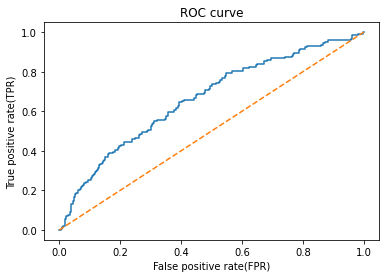

In [179]:
from sklearn import metrics
fpr,tpr,thresh = metrics.roc_curve(y_test,model_rf.predict_proba(X_test)[:,1])
plt.plot(fpr,tpr)
plt.plot(np.arange(0,1.1,0.1),np.arange(0,1.1,0.1),linestyle="dashed")
plt.xlabel("False positive rate(FPR)")
plt.ylabel("True positive rate(TPR)")
plt.title("ROC curve")
plt.show()

<Figure size 432x288 with 0 Axes>

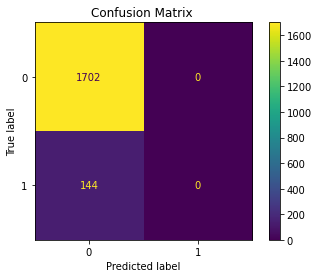

In [180]:
from sklearn.metrics import plot_confusion_matrix
plt.clf()
plot_confusion_matrix(model_rf,X_test,y_test)
plt.title('Confusion Matrix ')
plt.show()

### XGBoost with hyper parameter tuning

In [181]:
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
import xgboost
params={
 "xgb__learning_rate"    : [0.05, 0.10] ,
 "xgb__max_depth"        : [2,3,5],
 "xgb__min_child_weight" : [ 1, 3]
}
classifier=xgboost.XGBClassifier()
full_pipeline_with_predictor_xgb = Pipeline([
        ("preparation", data_prep_pipeline),
        ("xgb", xgboost.XGBClassifier())
    ])
random_search=RandomizedSearchCV(full_pipeline_with_predictor_xgb,param_distributions=params,n_iter=10,scoring='accuracy',cv=5,verbose=3)
random_search.fit(X_train,y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END xgb__learning_rate=0.1, xgb__max_depth=5, xgb__min_child_weight=3;, score=0.920 total time=   7.4s
[CV 2/5] END xgb__learning_rate=0.1, xgb__max_depth=5, xgb__min_child_weight=3;, score=0.918 total time=   7.3s
[CV 3/5] END xgb__learning_rate=0.1, xgb__max_depth=5, xgb__min_child_weight=3;, score=0.916 total time=   6.8s
[CV 4/5] END xgb__learning_rate=0.1, xgb__max_depth=5, xgb__min_child_weight=3;, score=0.918 total time=   5.5s
[CV 5/5] END xgb__learning_rate=0.1, xgb__max_depth=5, xgb__min_child_weight=3;, score=0.922 total time=   4.5s
[CV 1/5] END xgb__learning_rate=0.1, xgb__max_depth=2, xgb__min_child_weight=1;, score=0.921 total time=   2.1s
[CV 2/5] END xgb__learning_rate=0.1, xgb__max_depth=2, xgb__min_child_weight=1;, score=0.918 total time=   2.1s
[CV 3/5] END xgb__learning_rate=0.1, xgb__max_depth=2, xgb__min_child_weight=1;, score=0.919 total time=   2.1s
[CV 4/5] END xgb__learning_rate=0.1, xgb__m

RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('preparation',
                                              FeatureUnion(transformer_list=[('num_pipeline',
                                                                              Pipeline(steps=[('selector',
                                                                                               DataFrameSelector(attribute_names=['SK_ID_CURR',
                                                                                                                                  'CNT_CHILDREN',
                                                                                                                                  'AMT_INCOME_TOTAL',
                                                                                                                                  'AMT_CREDIT',
                                                                                                                                 

In [182]:
print("best params",random_search.best_params_)

best params {'xgb__min_child_weight': 1, 'xgb__max_depth': 2, 'xgb__learning_rate': 0.05}


In [183]:
np.random.seed(42)
full_pipeline_with_predictor_1 = Pipeline([
        ("preparation", data_prep_pipeline),
        ("xgb", xgboost.XGBClassifier(min_child_weight=1,max_depth=2,learning_rate=0.05))
    ])
model_xgb = full_pipeline_with_predictor_1.fit(X_train,y_train)

In [185]:
np.round(accuracy_score(y_train, model_xgb.predict(X_train)), 3)

0.922

In [186]:
roc_auc_score(y_train, model_xgb.predict_proba(X_train)[:, 1])

0.8272814767472462

In [187]:
from sklearn.metrics import f1_score
exp_name = "XG Boost Model"
expLog.loc[len(expLog)] = [f"{exp_name}"] + list(np.round(
               [accuracy_score(y_train, model_xgb.predict(X_train)), 
                accuracy_score(y_test, model_xgb.predict(X_test)),
                roc_auc_score(y_train, model_xgb.predict_proba(X_train)[:, 1]),
                roc_auc_score(y_test, model_xgb.predict_proba(X_test)[:, 1]),
                f1_score(y_train, model_xgb.predict(X_train), average='weighted'),
                f1_score(y_test, model_xgb.predict(X_test), average='weighted')],
    4)) 
expLog

,exp_name,Train Acc,Test Acc,Train AUC,Test AUC,Train F1,Test F1
0,Logistic Regression,0.9240,0.9112,0.8465,0.6855,0.8972,0.8827
1,Random Forest Model,0.9226,0.9220,0.9975,0.6616,0.8860,0.8846
2,XG Boost Model,0.9222,0.9220,0.8273,0.7207,0.8849,0.8846


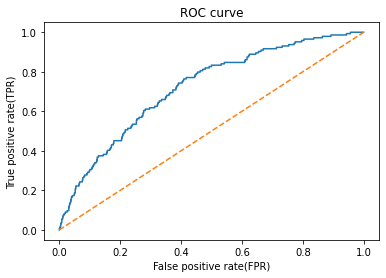

In [188]:
from sklearn import metrics
fpr,tpr,thresh = metrics.roc_curve(y_test,model_xgb.predict_proba(X_test)[:,1])
plt.plot(fpr,tpr)
plt.plot(np.arange(0,1.1,0.1),np.arange(0,1.1,0.1),linestyle="dashed")
plt.xlabel("False positive rate(FPR)")
plt.ylabel("True positive rate(TPR)")
plt.title("ROC curve")
plt.show()

<Figure size 432x288 with 0 Axes>

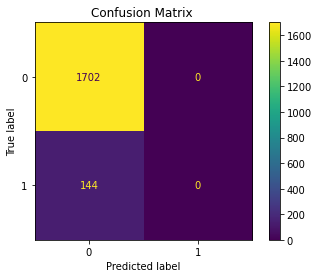

In [189]:
from sklearn.metrics import plot_confusion_matrix
plt.clf()
plot_confusion_matrix(model_xgb,X_test,y_test)
plt.title('Confusion Matrix ')
plt.show()

## Multilayer Perceptron

In [1]:
import pandas as pd
import numpy as np
import torch
from torch.utils.data import DataLoader,Dataset
import torch.optim as optim
from tqdm.notebook import tqdm
import torch.nn.functional as F

import torch.nn as nn



In [2]:
#Mount Google Drive

from google.colab import drive 
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [3]:
test_data = pd.read_csv('/content/gdrive/MyDrive/AML/home-credit-default-risk/Test.csv')

In [4]:
test_data

,0,1,2,3,4,5,6,7,8,9,...,157,158,159,160,161,162,163,164,165,Target
0,-0.486932,2.106840,-0.475346,0.439945,-0.161526,-0.123619,-0.12402,-0.124018,0.539098,0.509458,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0
1,0.386101,-0.337285,0.397462,0.803713,-0.845412,-0.123619,-0.12402,-0.124018,0.774297,0.781996,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0
2,0.095090,-0.337285,0.106526,-0.159637,0.714822,-0.123619,-0.12402,-0.124018,-0.285555,-0.213818,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0
3,-0.777942,-0.337285,-0.766283,-0.503642,0.563570,-0.123619,-0.12402,-0.124018,-0.812983,-0.591179,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1
4,-0.486932,-0.337285,-0.475346,0.939037,0.310593,-0.123619,-0.12402,-0.124018,0.880033,0.918265,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4960,-0.632437,-0.337285,-0.620815,-0.445024,1.078997,-0.123619,-0.12402,-0.124018,-0.452900,-0.517803,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0
4961,0.386101,-0.337285,0.397462,-0.184759,0.756322,-0.123619,-0.12402,-0.124018,0.220227,-0.266229,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1
4962,-0.195921,-0.337285,-0.184410,0.715283,-0.161526,-0.123619,-0.12402,-0.124018,0.639422,0.698138,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1
4963,0.095090,-0.337285,0.106526,-0.487899,-1.001219,-0.123619,-0.12402,-0.124018,-0.718487,-0.559732,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0


In [5]:
class HCDR_dataset(Dataset):
    def __init__(self, data_csv_path:str):
        self.data = pd.read_csv(data_csv_path)

    def __getitem__(self,idx):
        return torch.Tensor(self.data.iloc[idx,:-1]),self.data.iloc[idx,-1].astype(int).reshape(1,)
    def __len__(self):
        return len(self.data)
    


In [6]:
train_dataset = HCDR_dataset("/content/gdrive/MyDrive/AML/home-credit-default-risk/Train.csv")
test_dataset = HCDR_dataset("/content/gdrive/MyDrive/AML/home-credit-default-risk/Test.csv")
valid_dataset = HCDR_dataset("/content/gdrive/MyDrive/AML/home-credit-default-risk/Valid.csv")

In [7]:
from tensorflow.keras.callbacks import TensorBoard
from torch.utils.tensorboard import SummaryWriter
writer = SummaryWriter("/content/gdrive/MyDrive/AML/home-credit-default-risk/runs/")

In [8]:
class Linear_model(nn.Module):
    def __init__(self,n_hidden:int=3,n_neurons=[ 80,60,10],input_dim:int = 40,n_classes:int=1):
        super().__init__()

        self.n_hidden = n_hidden
        self.n_neurons  = n_neurons
        self.input_dim = input_dim
        self.n_classes = n_classes

        self.layer1 =  torch.nn.Linear(self.input_dim, self.n_neurons[0])
        self.layer_stack = nn.ModuleList([])
        for layers in range(len(self.n_neurons)):
            if layers+1>=len(self.n_neurons):
                self.layer_stack.append(torch.nn.Linear(self.n_neurons[layers], self.n_classes))
                break
            self.layer_stack.append(torch.nn.Linear(self.n_neurons[layers], self.n_neurons[layers+1]))



    def forward(self,x):
    
        x = F.relu(self.layer1(x))
        for d in range(len(self.n_neurons[:-1])):
            x = F.relu(self.layer_stack[d](x))
        x = F.relu(self.layer_stack[-1](x))
        return x

In [9]:
len(valid_dataset[0][0])

166

In [48]:
class MLP(nn.Module):
    def __init__(self,input_features=14,hidden1=20,hidden2=20,out_features=2):
        super().__init__()
        self.f_connected1 = nn.Linear(input_features,hidden1)
        self.f_connected2 = nn.Linear(hidden1,hidden2)
        self.out = nn.Linear(hidden2,out_features)
    def forward(self,x):
        x = F.leaky_relu(self.f_connected1(x))
        x = F.leaky_relu(self.f_connected2(x))
        x = self.out(x)
        return x

In [49]:
net = Linear_model(n_hidden=2,n_neurons=[20,20],input_dim=166)

In [50]:
net

<bound method Module.parameters of MLP(
  (f_connected1): Linear(in_features=14, out_features=20, bias=True)
  (f_connected2): Linear(in_features=20, out_features=20, bias=True)
  (out): Linear(in_features=20, out_features=2, bias=True)
)>

In [13]:
from torchsummary import summary

In [14]:
summary(net.cuda(),(1,166))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                 [-1, 1, 8]           1,336
            Linear-2                 [-1, 1, 8]              72
            Linear-3                 [-1, 1, 1]               9
Total params: 1,417
Trainable params: 1,417
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.00
Params size (MB): 0.01
Estimated Total Size (MB): 0.01
----------------------------------------------------------------


In [15]:
train_loader = DataLoader(train_dataset,batch_size=2048,shuffle=True)
valid_loader = DataLoader(valid_dataset,batch_size=2048,shuffle=False)
test_loader = DataLoader(test_dataset,batch_size=2048,shuffle=False)

In [17]:
criterion = nn.BCEWithLogitsLoss()
opt = optim.Adam(net.parameters(),lr=0.001)
loss_history = []
acc_history = []

def train_epoch(epoch, clf, criterion, opt, train_loader, num_of_epochs):
    clf.train() # set model in training mode (need this because of dropout)
    running_loss = 0.0
    
    # dataset API gives us pythonic batching 
    for batch_id, data in enumerate(train_loader):
        inputs, target = data[0].to("cuda"), data[1].to("cuda")    
        opt.zero_grad()
        preds = clf(inputs) #prediction over the input data
        loss = criterion(preds.double(), target.double()) 
        loss.backward()
        loss_history.append(loss.item())
        opt.step()
        running_loss += loss.item()
        if batch_id % 100 == 0:    # print every 100 mini-batches
            print(f"Epoch {epoch} of {num_of_epochs}, batch {batch_id+1}, batch loss: {np.round(loss.item(),6)}")
            running_loss = 0.0

    writer.add_scalar('Training loss', running_loss, epoch+1)

    return clf


def evaluate_model(epoch, clf, criterion, opt, data_loader, tag = "Test"):
    probas = []
    clf.eval() # set model in inference mode (need this because of dropout)
    correct = 0
    count = 0
    overall_loss = 0.0

    for i,data in enumerate(data_loader):
        inputs, targets = data[0].to("cuda"), data[1].to("cuda")                
        outputs = clf(inputs)
        predicted_classes = torch.sigmoid(outputs.data) 
        probas.append(predicted_classes)
        predicted_classes = (predicted_classes>0.5)*1
        correct += (predicted_classes.flatten().flatten() == targets.flatten()).sum().item()
       
        
        loss = criterion(outputs.double(), targets.double()) 
        loss_this_iter = loss.cpu().detach().numpy() 
        overall_loss += (loss_this_iter) 
        count += inputs.size(0)

    overall_loss /= len(data_loader.dataset)
    writer.add_scalar(f'{tag} loss', overall_loss, epoch+1)

    accuracy = 100. * correct / count
    acc_history.append(accuracy)
    print(f"{tag} {epoch} set: Average loss: {overall_loss:.6f}, Accuracy: {correct}/{count} ({accuracy:.000f}%)")
    return accuracy,probas


In [18]:

num_of_epochs = 30
for epoch in range(num_of_epochs):
    print("Epoch %d" % epoch)
    clf = train_epoch(epoch, net, criterion, opt, train_loader, num_of_epochs)
    evaluate_model(epoch, net, criterion, opt, valid_loader, tag = "Validation")
print("-"*50)
_,pred_proba = evaluate_model(epoch, net, criterion, opt, test_loader, tag="Test")


writer.flush()    
writer.close() 


Epoch 0
Epoch 0 of 30, batch 1, batch loss: 0.706397
Validation 0 set: Average loss: 0.000467, Accuracy: 2235/4469 (50%)
Epoch 1
Epoch 1 of 30, batch 1, batch loss: 0.694368
Validation 1 set: Average loss: 0.000456, Accuracy: 2504/4469 (56%)
Epoch 2
Epoch 2 of 30, batch 1, batch loss: 0.673597
Validation 2 set: Average loss: 0.000451, Accuracy: 2774/4469 (62%)
Epoch 3
Epoch 3 of 30, batch 1, batch loss: 0.66576
Validation 3 set: Average loss: 0.000447, Accuracy: 2844/4469 (64%)
Epoch 4
Epoch 4 of 30, batch 1, batch loss: 0.660621
Validation 4 set: Average loss: 0.000444, Accuracy: 2888/4469 (65%)
Epoch 5
Epoch 5 of 30, batch 1, batch loss: 0.659779
Validation 5 set: Average loss: 0.000442, Accuracy: 2918/4469 (65%)
Epoch 6
Epoch 6 of 30, batch 1, batch loss: 0.647244
Validation 6 set: Average loss: 0.000439, Accuracy: 2953/4469 (66%)
Epoch 7
Epoch 7 of 30, batch 1, batch loss: 0.652207
Validation 7 set: Average loss: 0.000438, Accuracy: 2961/4469 (66%)
Epoch 8
Epoch 8 of 30, batch 1, b

In [19]:
proba_Scores = []
for val in pred_proba:
  for x in val:
    proba_Scores.append(x.cpu().numpy()[0])

In [20]:
import sklearn.metrics as metrics

In [21]:
fpr, tpr, thresholds = metrics.roc_curve(y_true = test_data['Target'], y_score = proba_Scores, pos_label = 1) #positive class is 1; negative class is 0
auroc = metrics.auc(fpr, tpr)

In [22]:
print(auroc)

0.7054364521615641


## AUROC plotting

In [23]:
import matplotlib.pyplot as plt

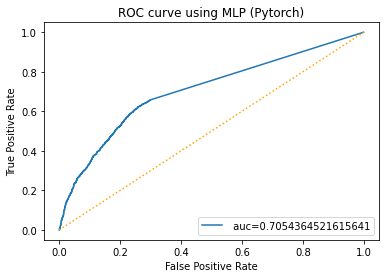

In [24]:
auc = metrics.roc_auc_score( test_data['Target'], proba_Scores)
plt.plot(fpr,tpr,label=" auc="+str(auc))
plt.plot(np.arange(0,2),np.arange(0,2),linestyle="dotted",color="orange")
plt.xlabel("False Positive Rate")

plt.ylabel("True Positive Rate")
plt.title("ROC curve using MLP (Pytorch)")
plt.legend(loc=4)
plt.show()

In [25]:
%load_ext tensorboard

In [26]:
%matplotlib inline


In [27]:
%tensorboard --logdir /content/gdrive/MyDrive/AML/home-credit-default-risk/ Viz/runs

Reusing TensorBoard on port 6007 (pid 4531), started 0:23:07 ago. (Use '!kill 4531' to kill it.)

<IPython.core.display.Javascript object>

## Tensor board visualizations

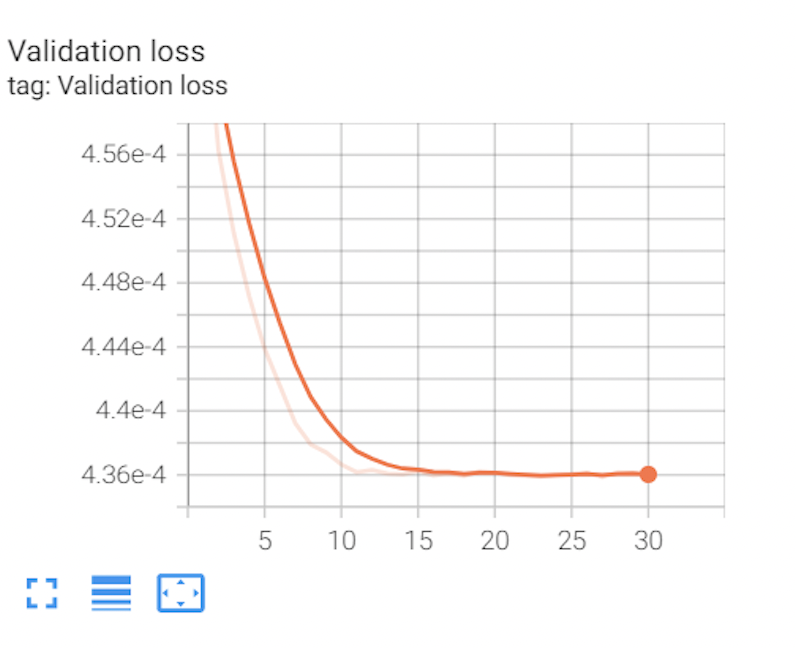

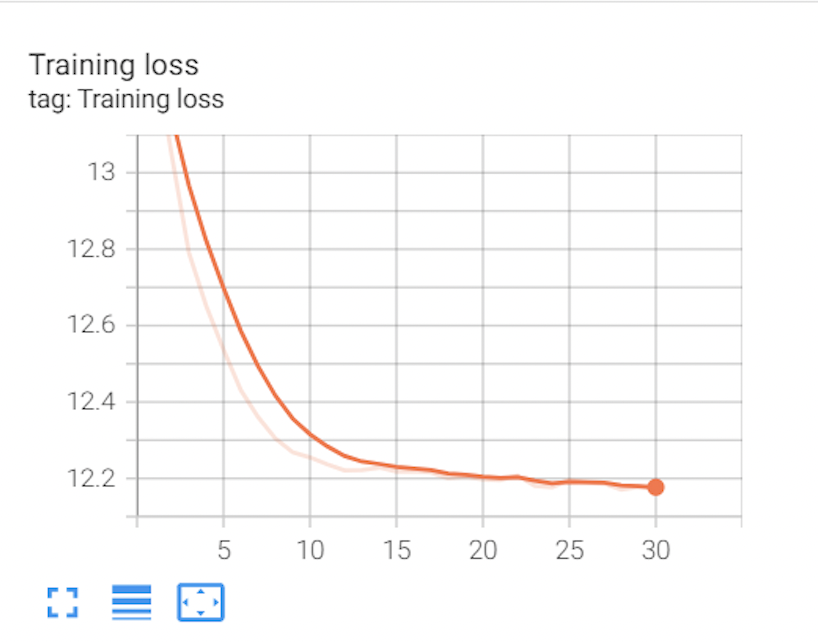

## Submission File Prep

For each SK_ID_CURR in the test set, you must predict a probability for the TARGET variable. The file should contain a header and have the following format:

```python 
SK_ID_CURR,TARGET
100001,0.1
100005,0.9
100013,0.2
etc.
```

Kaggle test preprocessing

# Kaggle submission via the command line API

In [182]:
X_kaggle_test.shape

(48744, 80)

In [184]:
app_train.shape

(307511, 195)

In [185]:
X_kaggle_test = X_kaggle_test.merge(pa_agg, how='left', on='SK_ID_CURR')

In [186]:
X_kaggle_test = X_kaggle_test.merge(bureau_agg, how='left', on="SK_ID_CURR")

In [187]:
X_kaggle_test['CREDIT_INCOME_PCT'] = X_kaggle_test['AMT_CREDIT'] / X_kaggle_test['AMT_INCOME_TOTAL']
X_kaggle_test['CREDIT_TERM'] = X_kaggle_test['AMT_ANNUITY'] / X_kaggle_test['AMT_CREDIT']

In [188]:
X_kaggle_test[pa_agg.columns] = X_kaggle_test[pa_agg.columns].fillna(0)

In [189]:
X_kaggle_test[bureau_agg.columns] = X_kaggle_test[bureau_agg.columns].fillna(0)

In [190]:
X_kaggle_test.shape

(48744, 194)

In [191]:
app_train.shape

(307511, 195)

In [206]:
test_class_scores = model_rf.predict(X_kaggle_test)

In [207]:

submit_df = pd.DataFrame({'SK_ID_CURR' : list(X_kaggle_test['SK_ID_CURR']), 'TARGET' : list(test_class_scores)})

In [208]:
submit_df.head()

,SK_ID_CURR,TARGET
0,100001,0
1,100005,0
2,100013,0
3,100028,0
4,100038,0


In [209]:
submit_df.to_csv("submission.csv",index=False)

In [210]:
!pwd

/content


In [211]:
from google.colab import files
files.download("submission.csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [7]:
# ! kaggle competitions submit -c home-credit-default-risk -f submission.csv -m "baseline submission"
#uploaded directly via web
! kaggle competitions submit -c home-credit-default-risk -f submission.csv -m "Group16_Phase4"

100%|███████████████████████████████████████| 1.26M/1.26M [00:01<00:00, 918kB/s]
Successfully submitted to Home Credit Default Risk

## report submission

Click on this [link](https://www.kaggle.com/c/home-credit-default-risk/submissions?sortBy=date&group=all&page=1)

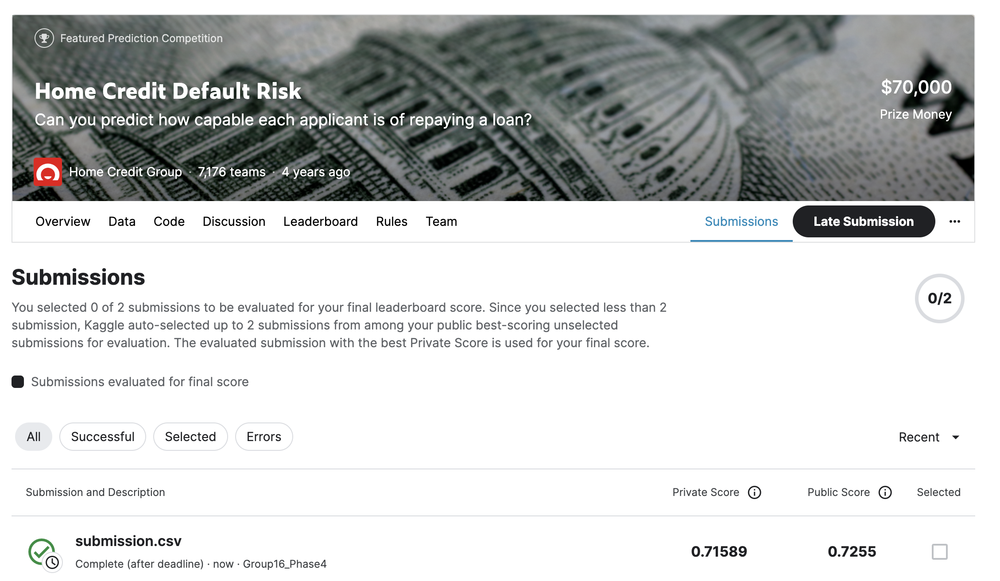

# Write-up 
For this phase of the project, you will need to submit a write-up summarizing the work you did. 
The write-up form is available on Canvas (Modules-> Module 12.1 - Course Project - Home Credit Default Risk (HCDR)-> FP Phase 2 (HCDR) : write-up form ). It has the following sections: 















## Abstract

Home Credit is a prominent developing market consumer financing specialist that has developed a platform that manages its core technology, product, and funding activities keeping in mind the local market needs. Their target market is underserved borrowers in the blue-collar and junior white-collar segments who have a steady source of income from their jobs or micro-businesses but are less likely to get loans from banks and other traditional lenders. It is vital for Financial Organizations to observe whether their loan applicants will be able to repay their loans. There are multiple parameters that need to be considered for optimally predicting if the client will be defaulting. The parameters that can be used are occupation, credit history, age, location, credit card usage, cash balance and others. We will thoroughly visualize and study these parameters before implementing them. Our goal is to make use of all the parameters to predict with the best possible efficacy which will aid financial organizations to make better decisions for their loan applicants.

To perform the Home Credit Default Risk project, we have extracted the data from the Kaggle competition 'Home Credit Risk Analysis' and performed Exploratory Data Analysis to understand and explore the data. Various visualizations were performed on most of the input features to the 'Target' variable to find the people at maximum risk. In the second phase of the project, the models built were overfitting. So, we have remodeled the old feature engineering on all the tables and added features such as AMT_DRAWING_ratio, DAYS_INSTALLMENTS_diff, and AMT_ANNUITY_ratio. Data leakage was taken into consideration throughout the project to retain the efficiency of the project. Modeled a neural network model and implemented Multi_layer Perceptron with the help of Pytorch. A Tensor board was used to visualize and track the training and validation loss of the models. The  Machine Learning Classifiers such as Logistic Regression, Random Forest, and XGBoost have performed better. The accuracies of our models improved compared to phase 3. Logistic Regression achieved a test accuracy of 91.1% and a test ROC_AUC score of 0.6855, whereas XGBoost has a better ROC_AUC  score, which is 0.7207. We have also implemented Multi-Layer Perceptron and achieved a test accuracy of 68% and a ROC_AUC score of 0.705. 
A Kaggle submission was made using the best performing model XGBoost and obtained a score of 0.7255.

For Kaggle submission, we obtained a public score of 0.7158 and a private score of 0.7255


## Introduction

### Data Description
Data Description 
 
In this project, seven different datasets are utilized. 
 
● Application_{train|test}.csv: 
 
 This is the primary dataset, it consists of 307,511 observations and 122 different variables which 
provide data on all the applicants. In this dataset, each applicant has a row with the Target variables 0 and 
1. Here, 0 indicates that the loan was repaid and 1 indicates that the loan was not paid. All the data points 
in this dataset are static for all applicants. 
 
● Bureau.csv: 
 
 Here, the data consists of the customer's previous credits from different financial companies that 
were reported to the Credit Bureau. Every previous credit has its own row, unlike application data where 
one loan can have multiple previous credits. 
 
● Bureau_Balance.csv: 
 
 This data has monthly balances of previous credit. Single previous credit can have multiple rows, 
one for every month in the period of credit length. 
 
● Credit_card_balance.csv: 
 
 All the monthly balances of previous credits taken by an individual with the Home Credit. A single 
credit card can have multiple rows with each row consisting of every month's balance. 
 
● Previous_application.csv: 
 
 Data consists of each person's previous loan application at Home Credit. Current loan applicants 
can have multiple previous loan applications. 
 
● POS_CASH_balance.csv: 
 
 In  this  dataset,  monthly  data  of  the  previous  point  of  sale  or  cash  loan  clients  had  with  Home 
Credit are present. A single previous loan can have multiple rows with each row representing one-month 
data of the previous point of sale or cash loan. 
 
● Installments_payments.csv: 
 
 The previous loan payment data is present with Home Credit. The data has both information on 
every missed and made payment.

### Tasks to be handled

- Building a Multi Layer Perceptron using PyTorch
- Using Tensorboard to visualize the results of training in real-time.
- We have increased number of features selected from 14(in Phase 3 ) to 50( in phase 4) and ran all the ML Classifiers.


## Neural Networks

We have built Multilayer perceptron using 3 hidden layers and {80,60,10} neurons with 40 input dimensions in the phase 4 of HCDR project.
And also we implemented Multilayer perceptron using 2 hidden layers and 20 neurons with 166 input dimensions.
We have acquired the AUC score - 0.705  and accuracy - 68%

Neural network architecture in string form for 3 hidden layers is 
- 80-Relu-BCE-60-Relu-BCE-10-Relu-BCE-1.

Neural network architecture in string form for 2 hidden layers is 
- 20-Relu-BCE-20-Relu-BCE-1.


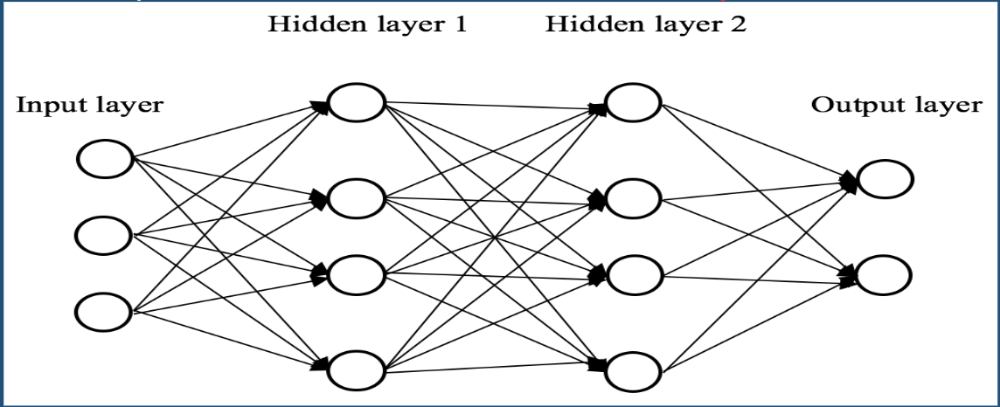



## Pipelines

Families of input features: count of numerical features: 106(int64, float64) count of categorical features: 16(object)
The total number of input features: 122 input features.
We have trained four models:

1. Logistic Classifier
2. RandomForestClassifier
3. XGBoost
4. Multilayer Perceptron


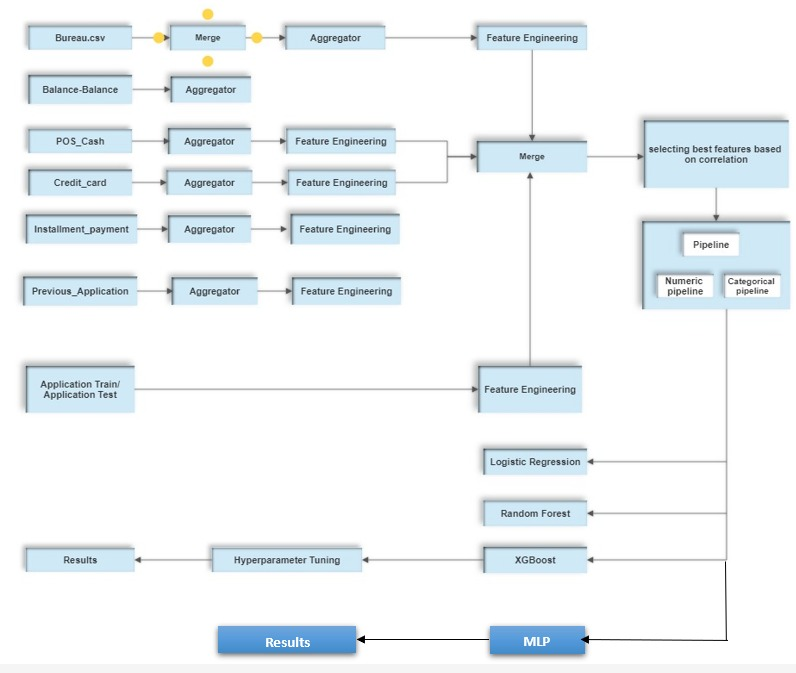

In [ ]:
from sklearn.preprocessing import OrdinalEncoder

# Identify the numeric features we wish to consider. 
num_attribs = imp_features

 # [
 #    'AMT_INCOME_TOTAL',  'AMT_CREDIT','DAYS_EMPLOYED','DAYS_BIRTH','EXT_SOURCE_1',
 #    'EXT_SOURCE_2','EXT_SOURCE_3']

num_pipeline = Pipeline([
        ('selector', DataFrameSelector(num_attribs)),
        ('imputer', SimpleImputer(strategy='mean')),
        ('std_scaler', StandardScaler()),
    ])
# Identify the categorical features we wish to consider.
cat_attribs = cat_cols2


# ['CODE_GENDER', 'FLAG_OWN_REALTY','FLAG_OWN_CAR','NAME_CONTRACT_TYPE', 
#                'NAME_EDUCATION_TYPE','OCCUPATION_TYPE','NAME_INCOME_TYPE']

# Notice handle_unknown="ignore" in OHE which ignore values from the validation/test that
# do NOT occur in the training set
cat_pipeline = Pipeline([
        ('selector', DataFrameSelector(cat_attribs)),
        #('imputer', SimpleImputer(strategy='most_frequent')),
        ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
        ('ohe', OneHotEncoder(sparse=False, handle_unknown="ignore"))
    ])

data_prep_pipeline = FeatureUnion(transformer_list=[
        ("num_pipeline", num_pipeline),
        ("cat_pipeline", cat_pipeline),
    ])
              



In [ ]:
%%time 
np.random.seed(42)
full_pipeline_with_predictor = Pipeline([
        ("preparation", data_prep_pipeline),
        ("linear", LogisticRegression())
    ])
model_lr = full_pipeline_with_predictor.fit(X_train, y_train)


In [ ]:
%%time 
np.random.seed(42)
full_pipeline_with_predictor_1 = Pipeline([
        ("preparation", data_prep_pipeline),
        ('rf', RandomForestClassifier(n_estimators=100,max_features=2,max_depth=10))
    ])
model_rf = full_pipeline_with_predictor_1.fit(X_train,y_train)

In [ ]:
%%time 
np.random.seed(42)
full_pipeline_with_predictor_1 = Pipeline([
        ("preparation", data_prep_pipeline),
        ("xgb", xgboost.XGBClassifier(min_child_weight=1,max_depth=2,learning_rate=0.05))
    ])
model_xgb = full_pipeline_with_predictor_1.fit(X_train,y_train)

## Data Leakage

Data leakage (or leakage) happens when your training data contains information about the target, but similar data will not be available when the model is used for prediction. We have split the dataset into training and test data. We are removing missing values in our data by replacing them with mean. We scaled the data using StandardScaler. Because of these factors, there will not be any significant data leakage in our modeled pipelines.



### Cardinal sins avoided:

To avoid overfitting we have splitted our data into train and test. The test dataset is only available when we train the model on the train set and once the evaluation is done. We can observe that the accuracy for the train and test are very close which avoids the overfitting the model.



## Loss Functions

## Log Loss 
Log loss is indictive of how close is the prediction probability is to the corresponding value/true value. The more the predicted probability diverges from the actual value, the higher is the log loss value.

In [12]:
import latexify
@latexify.function(use_math_symbols=True)
def logLoss():
    return (-1 / N) * Sigma(_i**N) (y_i * log(p(y_i)) + (1 - y_i) * log(1 - p(y_i)))
logLoss

## Gini Impurity
Gini Impurity is a measure of variance across the different classes

In [13]:
import latexify
@latexify.function(use_math_symbols=True)
def Gini(node):
    return Sigma(_i**c) (p_i * (1-p_i))
Gini

## Experimental results

In [187]:
expLog

,exp_name,Train Acc,Test Acc,Train AUC,Test AUC,Train F1,Test F1
0,Logistic Regression,0.9240,0.9112,0.8465,0.6855,0.8972,0.8827
1,Random Forest Model,0.9226,0.9220,0.9975,0.6616,0.8860,0.8846
2,XG Boost Model,0.9222,0.9220,0.8273,0.7207,0.8849,0.8846


## Discussion of Results

The models were overfitting in phase 3 and had an accuracy of 1. We improved this, and the models performed better than in the previous phase after increasing the number of features to 50.
Following are the results we have got in Phase 4:

Logistic Regression
- Test accuracy - 91%
- Test ROC_AUC - 0.685
 
 Random Forest
- Test accuracy - 92%
- Test ROC_AUC - 0.661
 
 XG Boost
- Test accuracy - 92%
- Test ROC_AUC- 0.720

 MLP
- Test accuracy - 68%
- Test ROC_AUC- 0.705

Overall, XGBoost performed better among all the models.




## Conclusion

After exploring new features from EDA in phase 2. We have focused much on improving the test accuracy, additional Feature Engineering, HyperParameter Tuning, Feature selection, analysis of Feature importance, and other ensemble methods in this phase.

In Phase 3, the data was trained and tested with the help of ML Classifiers Logistic Regression, Random Forest, and XGBoost. Accuracies and areas under the ROC_AUC curve were found and compared. We have improved our Logistic Regression and Random Forest compared to our phase 2 submission. Logistic Regression has achieved an accuracy of 0.808. We have achieved this by doing feature engineering on secondary and tertiary tables. Later we chose the 50 best-correlated columns and dropped all null values. We then performed hyper-parameter tuning. XGBoost gave an accuracy of 0.996.

In the final phase:
This project's main goal is to develop a Machine Learning model that can predict whether or not a loan applicant will be able to repay the loan. Without any statistical analysis, many deserving applicants with no credit history or default history get approved. The HCDR dataset is used to train the machine learning model. Based on the history of comparable applicants in the past, it will be able to estimate whether or not an applicant would be able to repay their loan. This model would help in the screening of applications by providing statistical support resulting from numerous aspects taken into account.

In the previous phase of the project the models were overfitting the data and hence got an accuracy score of 1, to overcome this we added new features using the pipelines, and tables were merged considering inherent hierarchy. A neural network model, Multi-layer Perceptron was implemented using PyTorch in the final phase, and MLP was modeled with two hidden layers, twenty neurons, and 166 input dimensions. This resulted in an accuracy of 68% with an AUC score of 0.705. Out of all models implemented, XGboost gave the best results resulting in an accuracy of 92.2 and an AUC score of 0.720. We have also made a Kaggle submission and obtained a score of 0.7255.

## Kaggle Submission

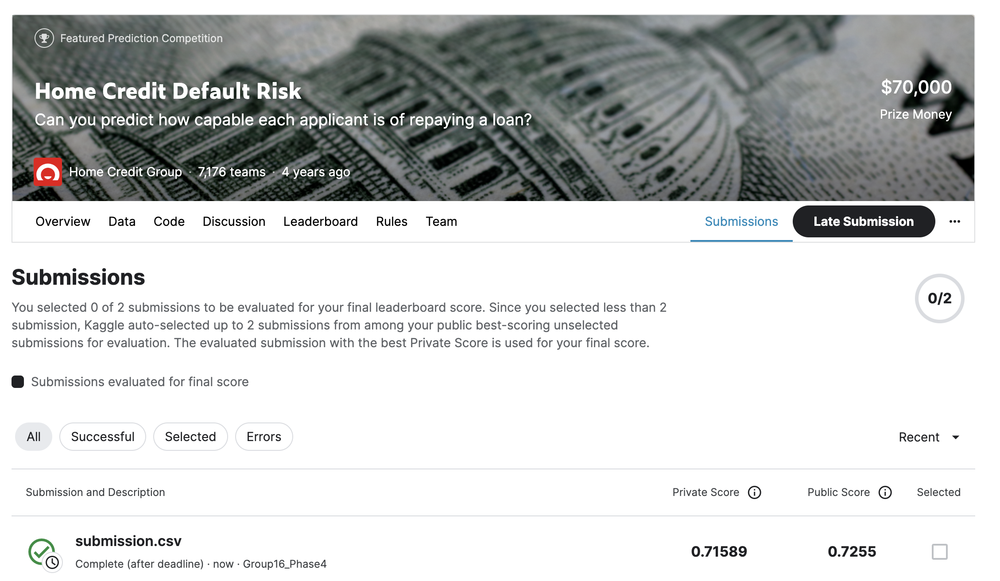

# References

Some of the material in this notebook has been adopted from [here](https://www.kaggle.com/willkoehrsen/start-here-a-gentle-introduction/notebook)


#  TODO: Predicting Loan Repayment with Automated Feature Engineering in Featuretools

Read the following:
* feature engineering via Featuretools library: 
  * https://github.com/Featuretools/predict-loan-repayment/blob/master/Automated%20Loan%20Repayment.ipynb
* https://www.analyticsvidhya.com/blog/2018/08/guide-automated-feature-engineering-featuretools-python/
* feature engineering paper: https://dai.lids.mit.edu/wp-content/uploads/2017/10/DSAA_DSM_2015.pdf
* https://www.analyticsvidhya.com/blog/2017/08/catboost-automated-categorical-data/